# Bayesian Analysis of ARPAV time series on temperatures
## ASPA 2025 Final Project - Group 2
### Brocco Luca, Cafagno Samuele, Cavallin Jonathan
This notebook aims to analyze ARPAV data coming from 4 weather stations which differ greatly in terms of surrounding environment:
- Auronzo di Cadore (Lat: $46^\circ\ 33'\ 33''$ N, Long: $12^\circ\ 25'\ 28''$ E, Alt over sea level: 887 m);
- Castelfranco Veneto (Lat: $45^\circ\ 40'\ 00''$ N, Long: $11^\circ\ 55'\ 00''$ E, Alt over sea level: 46 m);
- Porto Tolle (Lat: $44^\circ\ 56'\ 58''$ N, Long: $12^\circ\ 19'\ 28''$ E, Alt over sea level: -22 m);
- Roverchiara (Lat: $45^\circ\ 16'\ 10''$ N, Long: $11^\circ\ 14'\ 41''$ E, Alt over sea level: 20 m).

Datasets available to us are about **Temperature** parameter and cover a timespan from 1994 to 2024 (with missing data for Castelfranco Veneto).

First, we import some useful libraries:

In [ ]:
library(readxl)
library(tidyverse)
library(stringr)
library(ggplot2)
library(gridExtra)
library(grid)
library(rjags)
library(coda)
library(tidyr)
library(dplyr)
library(RColorBrewer)
options(warn = -1)

# Import Data

In [1]:
setwd("data_clone")

In [15]:
# to change directory
files <- list.files(pattern = "\\csv?$", full.names = TRUE)

process_file <- function(file_path) {
  file_name <- tools::file_path_sans_ext(basename(file_path))
  parts <- str_split(file_name, "_")[[1]]
  paese <- paste(parts[-length(parts)], collapse = "_")

  df <- read_csv(file_path, show_col_types = FALSE)
  df <- df %>% filter(!is.na(TMIN)) ##ho tolto i vari buchi soprattutto i 6 anni di castelfranco

  df$paese <- paese

  return(df)
}

df_list <- lapply(files, process_file)
df_import <- bind_rows(df_list)

#cat("nrow:", nrow(df_finale), "\n")
#cat("Paesi:", unique(df_finale$paese), "\n")
#cat("Anni:", unique(df_finale$date), "\n") ### !!! 'Medio mensile' è considerato un anno, toglibile se da problemi
df_94<-df_import%>%
      filter(year(date)>1993 & year(date)<2025)#%>%
      #rename(min = TMIN, mean = TMED, max = TMAX)

head(df_94)
tail(df_94)

date,TMIN,TMED,TMAX,paese
<date>,<dbl>,<dbl>,<dbl>,<chr>
1994-01-01,-6.1000,-2.1979,0.4000,Auronzo
1994-01-02,-12.7000,-7.5431,-2.3000,Auronzo
1994-01-03,-9.4407,-4.9648,2.1650,Auronzo
1994-01-04,-6.7956,-3.4558,-0.9134,Auronzo
1994-01-05,-2.9000,-0.0854,4.4000,Auronzo
1994-01-06,0.0000,0.9302,1.6000,Auronzo


date,TMIN,TMED,TMAX,paese
<date>,<dbl>,<dbl>,<dbl>,<chr>
2024-12-26,-3.8,1.2,9.3,Roverchiara
2024-12-27,-2.5,1.9,9.2,Roverchiara
2024-12-28,-2.0,3.2,11.8,Roverchiara
2024-12-29,-2.2,2.4,11.4,Roverchiara
2024-12-30,-2.3,2.1,11.4,Roverchiara
2024-12-31,-2.8,1.5,9.8,Roverchiara


We have daily data for minimum, mean and maximum temperatures. The analysis will be performed for all the temperature types, for all stations, treating indipendently each station's data and each temperature's data (for a total of 12 combinations of station-type)

#### Important note!
Data is missing for **Castelfranco**'s station from 2004 to 2010. Data available to us for this station is the combination of two independent datasets. This makes this station's data unreliable for accurate analysis (more on later).

## 0) Study the evolution over time of the min, max and average temperatures
We have daily temperature data: we average over months and years to retrieve temperature trends over the years. We then plot the results to have a visual representation of our datasets.

In [16]:
df_month<- df_94 %>%
  mutate(Anno = year(date),
         Mese = month(date)) %>%
  group_by(paese, Anno, Mese) %>%
  summarise(
    min = mean(TMIN, na.rm = TRUE),
    mean = mean(TMED, na.rm = TRUE),
    max = mean(TMAX, na.rm = TRUE),
    .groups = "drop"
  )

df_long <- df_month%>%
  pivot_longer(cols = c(min, mean, max),
               names_to = "tipo",
               values_to = "valore")

mese_abb <- c("GEN", "FEB", "MAR", "APR", "MAG", "GIU", "LUG", "AGO", "SET", "OTT", "NOV", "DIC")
df_long <- df_long %>%
  mutate(mese_abb = mese_abb[Mese]) 

### to have months as columns
df_wide <- df_long %>%
  select(paese, Anno, tipo, mese_abb, valore) %>%
  pivot_wider(names_from = mese_abb, values_from = valore)

df_finale <- df_wide %>%
  rowwise() %>%
  mutate(Medio = mean(c_across(all_of(mese_abb)), na.rm = TRUE)) %>% # 2025 removed because there were problems with the averages 
  ungroup()

head(df_finale)

paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064


In [17]:
df_finale_months <- df_finale |> select('GEN':'DIC')
df_finale$std <- apply(df_finale_months,1,sd)/(12)^0.5 # sd over rows
head(df_finale)


paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,std
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995,1.766283
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837,2.112294
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319,2.382074
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853,1.915043
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163,2.141889
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064,2.376033


In [9]:
## version without 'Medio mensile'

df_anni <- df_finale %>% 
  filter(Anno != "Medio mensile") %>%
  mutate(Anno = as.numeric(Anno),Medio = as.numeric(Medio))

df_min <- df_anni %>% 
  filter(tipo == "min")
df_max <- df_anni %>% 
  filter(tipo == "max")
df_mean <- df_anni %>% 
  filter(tipo == "mean")

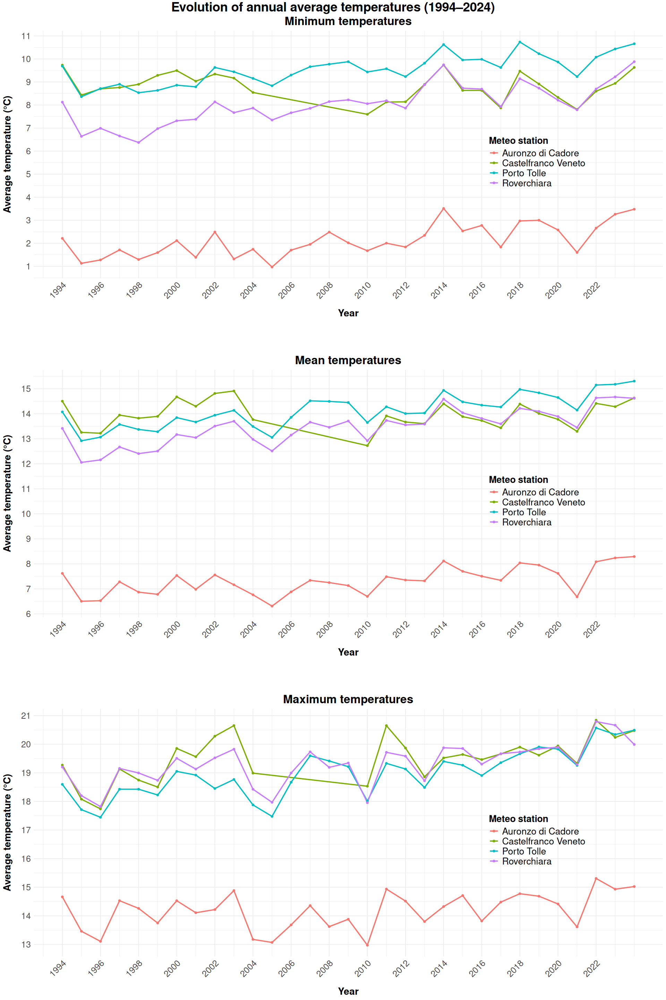

In [10]:

names_stat <- c("Roverchiara" = "Roverchiara", "Castelfranco" = "Castelfranco Veneto",
  "PortoTolle" = "Porto Tolle","Auronzo" = "Auronzo di Cadore")

plot_0 <- function(df, title, names) {
  ggplot(df, aes(x = Anno, y = Medio, color = paese)) +
    geom_line(size = 1) +
    geom_point() +
    scale_color_discrete(labels = names) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station"
    ) +
    theme_minimal() +
    scale_x_continuous(breaks = seq(1994, 2022, 2)) +
    scale_y_continuous(breaks = seq(0, 21, 1)) +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 15),
      axis.text.y = element_text(size = 15),
      axis.title.x = element_text(size = 17, margin = margin(t = 15),face="bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15),face="bold"),
      legend.position = c(0.8, 0.47),
      legend.title = element_text(size = 16,face="bold"),
      legend.text = element_text(size = 16)
    )
}


options(repr.plot.width = 16, repr.plot.height = 24)


min_plot <- plot_0(df_min, 'Minimum temperatures', names_stat)
mean_plot <- plot_0(df_mean, 'Mean temperatures', names_stat)
max_plot <- plot_0(df_max, 'Maximum temperatures', names_stat)

grid.arrange(
  min_plot, nullGrob(), mean_plot, nullGrob(), max_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2024)', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"))
)

## 1) Analysis of the evolution of the annual average of the min, max and daily average temperature over time (1994-2024).

## 1.1) 
Study the trend of the annual averages and compare them with a constant value or a rising trend
(for instance linear or quadratic).

We now want to identify the **trend** of the temperatures over the years. We tried to fit our data with a **constant** and with a **linear regression**.

In [11]:
#linear fit 

lin_fits <- list()
  
for (i in names(names_stat)) {  
  df_min_i  <- df_min[df_min$paese == i,]
  df_mean_i <- df_mean[df_mean$paese == i,]
  df_max_i  <- df_max[df_max$paese == i,]
  
  if (nrow(df_min_i) == 0 || nrow(df_mean_i) == 0 || nrow(df_max_i) == 0) {
    cat("No data found for station:", i, "\n")
    next}

  lin_fit_min  <- lm(Medio ~ Anno, data = df_min_i,weights = 1/std^2)
  lin_fit_mean <- lm(Medio ~ Anno, data = df_mean_i,weights = 1/std^2)
  lin_fit_max  <- lm(Medio ~ Anno, data = df_max_i,weights = 1/std^2)

  lin_fits[[i]] <- list(
    min = lin_fit_min,
    mean = lin_fit_mean,
    max = lin_fit_max) }

cat("LINEAR FIT\n")
lin_fits


const_fits <- list()
  
for (i in names(names_stat)) {  
  df_min_i  <- df_min[df_min$paese == i,]
  df_mean_i <- df_mean[df_mean$paese == i,]
  df_max_i  <- df_max[df_max$paese == i,]
  
  if (nrow(df_min_i) == 0 || nrow(df_mean_i) == 0 || nrow(df_max_i) == 0) {
    cat("No data found for station:", i, "\n")
    next}

  const_fit_min  <- lm(Medio ~ 1, data = df_min_i,weights = 1/std^2)
  const_fit_mean <- lm(Medio ~ 1, data = df_mean_i,weights = 1/std^2)
  const_fit_max  <- lm(Medio ~ 1, data = df_max_i,weights = 1/std^2)

  const_fits[[i]] <- list(
    min = const_fit_min,
    mean = const_fit_mean,
    max = const_fit_max) }
cat("CONSTANT FIT\n")
const_fits

LINEAR FIT


$Roverchiara
$Roverchiara$min

Call:
lm(formula = Medio ~ Anno, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
 -141.93631      0.07468  


$Roverchiara$mean

Call:
lm(formula = Medio ~ Anno, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
 -117.78664      0.06534  


$Roverchiara$max

Call:
lm(formula = Medio ~ Anno, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  -82.95907      0.05091  



$Castelfranco
$Castelfranco$min

Call:
lm(formula = Medio ~ Anno, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
   31.03931     -0.01106  


$Castelfranco$mean

Call:
lm(formula = Medio ~ Anno, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  10.306411     0.001824  


$Castelfranco$max

Call:
lm(formula = Medio ~ Anno, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)         Anno  
  -69.27094      0.04418  



$PortoTolle
$Por

CONSTANT FIT


$Roverchiara
$Roverchiara$min

Call:
lm(formula = Medio ~ 1, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)  
      8.076  


$Roverchiara$mean

Call:
lm(formula = Medio ~ 1, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)  
      13.47  


$Roverchiara$max

Call:
lm(formula = Medio ~ 1, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)  
      19.32  



$Castelfranco
$Castelfranco$min

Call:
lm(formula = Medio ~ 1, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)  
      8.828  


$Castelfranco$mean

Call:
lm(formula = Medio ~ 1, data = df_mean_i, weights = 1/std^2)

Coefficients:
(Intercept)  
      13.97  


$Castelfranco$max

Call:
lm(formula = Medio ~ 1, data = df_max_i, weights = 1/std^2)

Coefficients:
(Intercept)  
      19.51  



$PortoTolle
$PortoTolle$min

Call:
lm(formula = Medio ~ 1, data = df_min_i, weights = 1/std^2)

Coefficients:
(Intercept)  
      9.552  


$PortoTolle$mean

Call:
lm(formula = Medio ~ 1, da

In [12]:
##comparison of the two models
for (i in names(names_stat)) {
  for (type in c("min", "mean", "max")) {
    cat('Comparison between models: ', i, type, '\n')
    print(anova(const_fits[[i]][[type]], lin_fits[[i]][[type]]))
    cat('\n')
    }
  }

Comparison between models:  Roverchiara min 
Analysis of Variance Table

Model 1: Medio ~ 1
Model 2: Medio ~ Anno
  Res.Df    RSS Df Sum of Sq     F    Pr(>F)    
1     30 6.5816                                 
2     29 2.7860  1    3.7957 39.51 7.295e-07 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Comparison between models:  Roverchiara mean 
Analysis of Variance Table

Model 1: Medio ~ 1
Model 2: Medio ~ Anno
  Res.Df    RSS Df Sum of Sq      F    Pr(>F)    
1     30 3.1524                                  
2     29 1.0678  1    2.0846 56.614 2.708e-08 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Comparison between models:  Roverchiara max 
Analysis of Variance Table

Model 1: Medio ~ 1
Model 2: Medio ~ Anno
  Res.Df    RSS Df Sum of Sq      F    Pr(>F)    
1     30 2.3112                                  
2     29 1.3450  1   0.96618 20.832 8.502e-05 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Compar

The error (RSS) is significantly lower using the linear model rather than the constant model.

In [13]:
lin_summary <- data.frame(
  paese = character(),
  temp = character(),
  intercept = numeric(),
  slope = numeric(),
  intercept_se = numeric(),
  slope_se = numeric(),
  r_squared = numeric(),
  p_value = numeric(),
  residual_se = numeric(),
  stringsAsFactors = FALSE)

for (i in names(lin_fits)) {
  for (stat in c("min", "mean", "max")) {
    fit <- lin_fits[[i]][[stat]]
    summary_fit <- summary(fit)

    lin_summary <- rbind(lin_summary, data.frame(
      paese = i,
      temp = stat,
      intercept = coef(fit)[1],
      slope = coef(fit)[2],
      intercept_se = coef(summary_fit)[, "Std. Error"][1],
      slope_se = coef(summary_fit)[, "Std. Error"][2],
      r_squared = summary_fit$r.squared,
      p_value = coef(summary_fit)[, "Pr(>|t|)"][2], # p-value tests the null hypothesis: fit slope=0
      residual_se = summary_fit$sigma),
      make.row.names = FALSE) }
}
lin_summary


###constant fit
const_summary <- data.frame(
  paese = character(),
  temp = character(),
  intercept = numeric(),
  intercept_se = numeric(),
  residual_se = numeric(),
  stringsAsFactors = FALSE)

for (i in names(const_fits)) {
  for (stat in c("min", "mean", "max")) {
    fit <- const_fits[[i]][[stat]]
    summary_fit <- summary(fit)

    const_summary <- rbind(const_summary, data.frame(
      paese = i,
      temp = stat,
      intercept = coef(fit)[1],
      intercept_se = coef(summary_fit)[, "Std. Error"][1],
      residual_se = summary_fit$sigma),
      make.row.names = FALSE)
  }
}
const_summary


paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Roverchiara,min,-141.93631,0.074675865,23.86580,0.011880217,0.576706823,7.295410e-07,0.3099477
Roverchiara,mean,-117.78664,0.065340335,17.44501,0.008683951,0.661272467,2.708450e-08,0.1918881
Roverchiara,max,-82.95907,0.050907708,22.40848,0.011153702,0.418043536,8.501852e-05,0.2153602
Castelfranco,min,31.03931,-0.011055101,24.93245,0.012409228,0.032010705,3.818393e-01,0.3040848
Castelfranco,mean,10.30641,0.001823974,22.27826,0.011087455,0.001126348,8.707090e-01,0.2428447
Castelfranco,max,-69.27094,0.044175337,26.56039,0.013215602,0.317666419,2.713628e-03,0.2648194
PortoTolle,min,-102.19146,0.055628842,17.40438,0.008664236,0.587029821,5.059492e-07,0.2195147
PortoTolle,mean,-103.29838,0.058457110,15.65242,0.007791516,0.659983310,2.864357e-08,0.1772794
PortoTolle,max,-122.77320,0.070558203,20.83553,0.010371243,0.614793380,1.806317e-07,0.2184067


paese,temp,intercept,intercept_se,residual_se
<chr>,<chr>,<dbl>,<dbl>,<dbl>
Roverchiara,min,8.076275,0.1599601,0.4683884
Roverchiara,mean,13.472870,0.1325839,0.3241613
Roverchiara,max,19.316629,0.1304608,0.2775610
Castelfranco,min,8.827809,0.1191731,0.3028273
Castelfranco,mean,13.971318,0.1054748,0.2380724
Castelfranco,max,19.510524,0.1526382,0.3141139
PortoTolle,min,9.552493,0.1182921,0.3358479
PortoTolle,mean,14.135277,0.1180824,0.2989142
PortoTolle,max,18.974779,0.1482029,0.3459852


The p-value tests the null hypothesis that the slope coefficient $b$ is compatibile with zero, meaning that there is no statistically significant correlation between the two variables. It is computed defyning the t-student variable:

$$t= \frac{\hat{b}}{\sigma_{\hat{b}}} $$ 

where $\hat{b}$ is the  estimator for the slope and $\sigma_{\hat{b}}$ is its standard deviation, and performing a two-sided hypothesis testing. In almost all cases we can reject the null hypothesis with high $CL > 95\%$, and thus claim there is a non zero (in this case positive) correlation between mean temperatures and time, with the exception for:
- Min temperatures in Castelfranco Veneto: p-value = 0.38
- Mean temperatures in Castelfranco Veneto: p-value = 0.87

Castelfranco Veneto's dataset is not reliable: since it is made of two independent datasets, we don't know if the sensors / measuring instruments are the same for the two parts. For this reason, we are not confident of the results of the hypothesis test here.

We then plot the data with the fitted models and their errors:

In [67]:

years <- sort(unique(as.numeric(as.character(df_min$Anno))))

pred_df <- data.frame()
years <- unique(df_min$Anno)

for (i in 1:nrow(lin_summary)) {
  row <- lin_summary[i,]
  model <- lin_fits[[row$paese]][[row$temp]]

  df_stat <- switch(row$temp,
                    "min" = df_min,
                    "mean" = df_mean,
                    "max" = df_max)
  
  df_station <- df_stat[df_stat$paese == row$paese, ]
  
  # linear fit prediction 
  newdata <- data.frame(Anno = years)
  pred <- predict(model, newdata = newdata, se.fit = TRUE)
  
  # compute chi_squared 
  y_obs <- df_station$Medio
  y_pred_obs <- predict(model, newdata = df_station)
  y_err <- df_station$std
  
  chi_squared <- sum(((y_obs-y_pred_obs)^2)/(y_err^2), na.rm = TRUE)


  temp_df <- data.frame(
    paese = row$paese,
    temp = row$temp,
    Anno = years,
    prediction = pred$fit,
    prediction_se = pred$se.fit,
    chi_squared = chi_squared  # same value repeated for all rows
  )
  
  pred_df <- rbind(pred_df, temp_df)
}
head(pred_df)



##constant fit
pred_df_const <- data.frame()

for (i in 1:nrow(const_summary)) {
  row <- const_summary[i,]
  model <- const_fits[[row$paese]][[row$temp]]

  df_stat <- switch(row$temp,
                    "min" = df_min,
                    "mean" = df_mean,
                    "max" = df_max)

  df_station <- df_stat[df_stat$paese == row$paese, ]
  newdata <- data.frame(Anno = unique(df_station$Anno))  # anche se anno non entra nel modello serve per i grafici

  pred <- predict(model, newdata = newdata, se.fit = TRUE)

  y_obs <- df_station$Medio
  y_pred_obs <- predict(model, newdata = df_station)
  y_err <- df_station$std
  chi_squared <- sum(((y_obs - y_pred_obs)^2) / (y_err^2), na.rm = TRUE)

  temp_df <- data.frame(
    paese = row$paese,
    temp = row$temp,
    Anno = newdata$Anno,
    prediction = pred$fit,
    prediction_se = pred$se.fit,
    chi_squared = chi_squared
  )

  pred_df_const <- rbind(pred_df_const, temp_df)
}

head(pred_df_const)

,paese,temp,Anno,prediction,prediction_se,chi_squared
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,1994,6.967371,0.2057352,2.785959
2,Roverchiara,min,1995,7.042047,0.1956436,2.785959
3,Roverchiara,min,1996,7.116722,0.1857636,2.785959
4,Roverchiara,min,1997,7.191398,0.1761309,2.785959
5,Roverchiara,min,1998,7.266074,0.1667883,2.785959
6,Roverchiara,min,1999,7.340750,0.1577874,2.785959


,paese,temp,Anno,prediction,prediction_se,chi_squared
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,1994,8.076275,0.1599601,6.581631
2,Roverchiara,min,1995,8.076275,0.1599601,6.581631
3,Roverchiara,min,1996,8.076275,0.1599601,6.581631
4,Roverchiara,min,1997,8.076275,0.1599601,6.581631
5,Roverchiara,min,1998,8.076275,0.1599601,6.581631
6,Roverchiara,min,1999,8.076275,0.1599601,6.581631


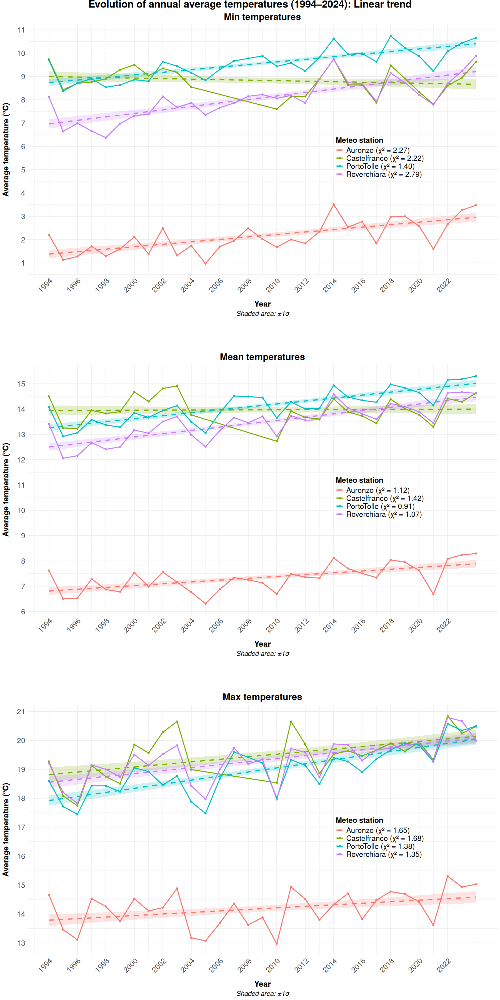

In [15]:
plot_1 <- function(df,pred_df,temp_type,title,names) {
  df <- df[df$tipo == temp_type,]     
  pred_df <- pred_df[pred_df$temp == temp_type,]  
  
  df$Anno <- as.numeric(as.character(df$Anno))
  pred_df$Anno <- as.numeric(as.character(pred_df$Anno))
    
  df$Medio <- as.numeric(as.character(df$Medio))
    
  pred_df$prediction <- as.numeric(as.character(pred_df$prediction))
  pred_df$prediction_se <- as.numeric(as.character(pred_df$prediction_se))
  chi_values <- pred_df |> group_by(paese) |> summarise(chi_squared=mean(chi_squared),.groups = "drop") 
  legend_labels <- setNames(
      sprintf("%s (χ² = %.2f)", chi_values$paese, chi_values$chi_squared),
      chi_values$paese)
    
  ggplot() +
    geom_ribbon(data = pred_df, aes(x=Anno, ymin=prediction-prediction_se, 
                                   ymax = prediction+prediction_se, fill = paese), alpha = 0.2, show.legend = FALSE) +
    geom_line(data = pred_df, aes(x=Anno, y=prediction, color = paese), size = 1.2, linetype = "dashed") +
    geom_line(data = df, aes(x=Anno, y=Medio, color=paese), size = 1) +
    geom_point(data = df, aes(x=Anno, y=Medio, color=paese)) +

    scale_color_discrete(labels = legend_labels) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station",
      fill=NULL,
      caption = "Shaded area: ±1σ"
    ) +
    scale_x_continuous(breaks = seq(1994, 2022, 2))+
    scale_y_continuous(breaks = seq(0, 21, 1))+
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 16),
      axis.text.y = element_text(size = 16),
      axis.title.x = element_text(size = 17, margin = margin(t = 15), face = "bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15), face = "bold"),
      legend.position = c(0.75, 0.47),
      legend.title = element_text(size = 16, face = "bold"),
      legend.text = element_text(size = 16),
      plot.caption = element_text(size = 14.5, hjust = 0.5, face = "italic"))
}


options(repr.plot.width = 15, repr.plot.height = 30)
min_lin_fit_plot <-plot_1(df_finale,pred_df,"min",'Min temperatures',names_stat)
mean_lin_fit_plot <-plot_1(df_finale,pred_df,"mean",'Mean temperatures',names_stat)
max_lin_fit_plot <-plot_1(df_finale,pred_df,"max",'Max temperatures',names_stat)
grid.arrange(
  min_lin_fit_plot, nullGrob(), mean_lin_fit_plot, nullGrob(), max_lin_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2024): Linear trend', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" )
)

We can compute the residuals for each fit and check their distribution

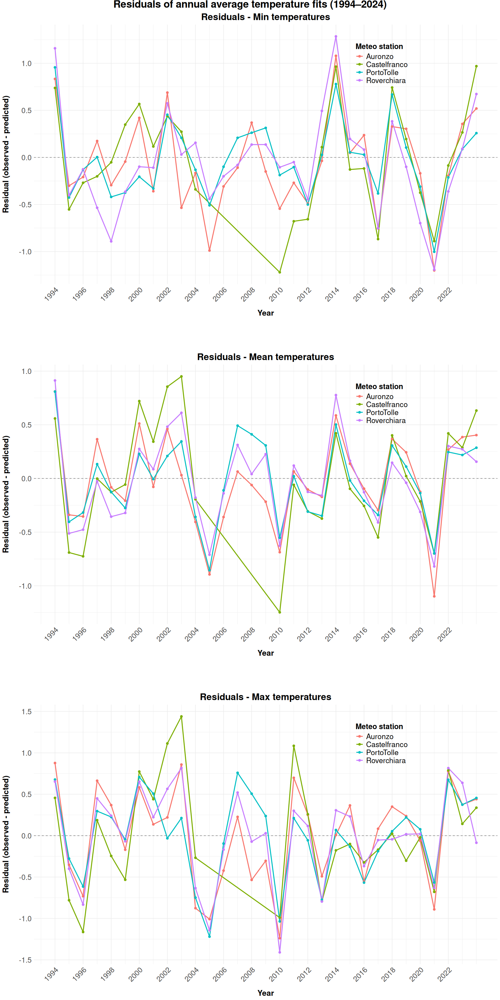

In [16]:
plot_residuals <- function(df, pred_df, temp_type, title) {
  df <- df[df$tipo == temp_type,]     
  pred_df <- pred_df[pred_df$temp == temp_type,]  
  
  df$Anno <- as.numeric(as.character(df$Anno))
  df$Medio <- as.numeric(as.character(df$Medio))
  
  pred_df$Anno <- as.numeric(as.character(pred_df$Anno))
  pred_df$prediction <- as.numeric(as.character(pred_df$prediction))
  
  residual_df <- merge(df, pred_df[, c("Anno", "paese", "prediction")], 
                       by = c("Anno", "paese"), suffixes = c("_obs", "_pred"))
  residual_df$residual <- residual_df$Medio - residual_df$prediction
  
  ggplot(residual_df, aes(x = Anno, y = residual, color = paese)) +
    geom_hline(yintercept = 0, linetype = "dashed", color = "gray50") +
    geom_line(size = 1) +
    geom_point(size = 2) +
    labs(
      title = paste("Residuals -", title),
      x = "Year",
      y = "Residual (observed - predicted)",
      color = "Meteo station"
    ) +
    scale_x_continuous(breaks = seq(1994, 2022, 2)) +
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 16),
      axis.text.y = element_text(size = 16),
      axis.title.x = element_text(size = 17, margin = margin(t = 15), face = "bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15), face = "bold"),
      legend.position = c(0.75, 0.85),
      legend.title = element_text(size = 16, face = "bold"),
      legend.text = element_text(size = 16)
    )
}

# use the function for all types
min_resid_plot <- plot_residuals(df_finale, pred_df, "min", "Min temperatures")
mean_resid_plot <- plot_residuals(df_finale, pred_df, "mean", "Mean temperatures")
max_resid_plot <- plot_residuals(df_finale, pred_df, "max", "Max temperatures")

# plot 
grid.arrange(
  min_resid_plot, nullGrob(), mean_resid_plot, nullGrob(), max_resid_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Residuals of annual average temperature fits (1994–2024)', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3, just="top")
)


The residuals of linear fits do not show a bias towards positive or negative: errors are caused from statistical oscillations from the trend, but the trend is trustable.

Let's now check the constant fits:

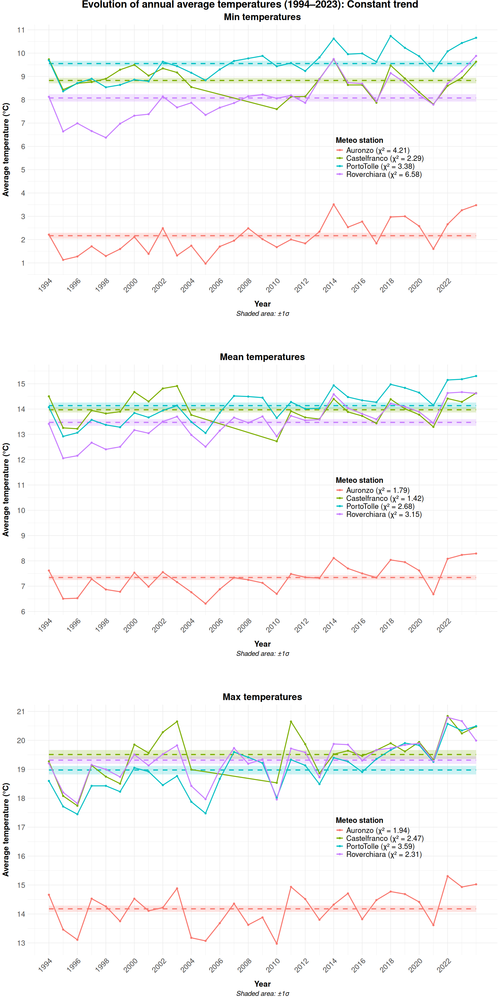

In [17]:
min_const_fit_plot <- plot_1(df_finale, pred_df_const, "min", "Min temperatures", names_stat)
mean_const_fit_plot <- plot_1(df_finale, pred_df_const, "mean", "Mean temperatures", names_stat)
max_const_fit_plot <- plot_1(df_finale, pred_df_const, "max", "Max temperatures", names_stat)
grid.arrange(
  min_const_fit_plot, nullGrob(), mean_const_fit_plot, nullGrob(), max_const_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): Constant trend', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" )
)

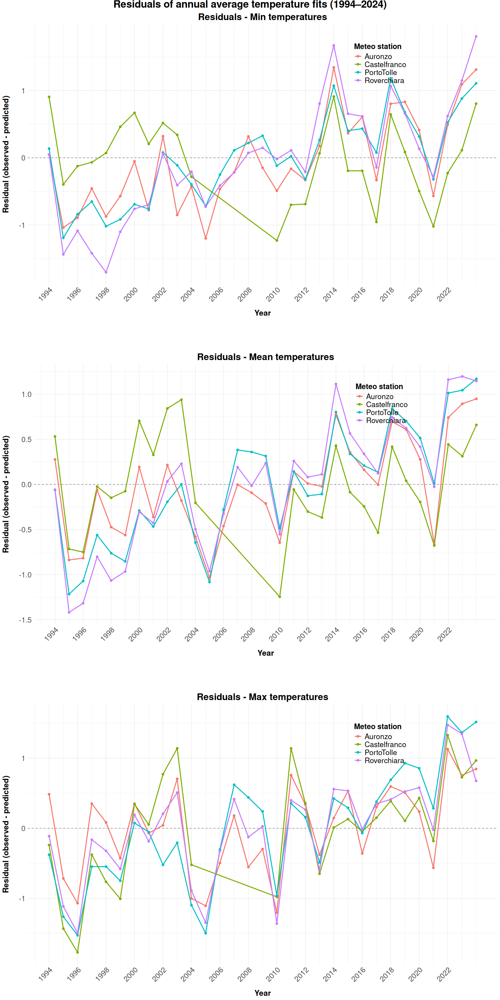

In [18]:
# use the function for all types
min_resid_plot <- plot_residuals(df_finale, pred_df_const, "min", "Min temperatures")
mean_resid_plot <- plot_residuals(df_finale, pred_df_const, "mean", "Mean temperatures")
max_resid_plot <- plot_residuals(df_finale, pred_df_const, "max", "Max temperatures")

# plot 
grid.arrange(
  min_resid_plot, nullGrob(), mean_resid_plot, nullGrob(), max_resid_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Residuals of annual average temperature fits (1994–2024)', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3, just="top")
)


In this case the residuals show a clear trend: they have negative values for past years and positive for more recent ones. The constant fit is then not capturing the trend in the data and looks biased.

We perform a $\chi^2$ test evaluate whether the observed data are consistent with a linear model. With 10 degrees of freedom and a $CL=95\%$ the critical value is $\chi^2_0\approx 18.3$, in all cases we obtain significantly lower $\chi^2$ values, thus we can claim that mean temperatures data for all stations are highly consistent with a linear trend model (p-value > 0.986 in all cases).

In [19]:
p_value_chi <- 1- pchisq(2.79,10)
p_value_chi

[1] 0.9859431

## 1.2)
Perform an analysis using a Bayesian linear regression with JAGS or STAN.

We implement a  **Bayesian Linear regression** using MCMC algorithms with **JAGS**. We choose as **prior** for the parameters of the simulation a gaussian distribution centered at the values found in **1.1)**.

In [20]:
head(lin_summary)

,paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,-141.93631,0.074675865,23.86580,0.011880217,0.576706823,7.295410e-07,0.3099477
2,Roverchiara,mean,-117.78664,0.065340335,17.44501,0.008683951,0.661272467,2.708450e-08,0.1918881
3,Roverchiara,max,-82.95907,0.050907708,22.40848,0.011153702,0.418043536,8.501852e-05,0.2153602
4,Castelfranco,min,31.03931,-0.011055101,24.93245,0.012409228,0.032010705,3.818393e-01,0.3040848
5,Castelfranco,mean,10.30641,0.001823974,22.27826,0.011087455,0.001126348,8.707090e-01,0.2428447
6,Castelfranco,max,-69.27094,0.044175337,26.56039,0.013215602,0.317666419,2.713628e-03,0.2648194


In [21]:
prior_min <- lin_summary[which(lin_summary$temp == "min"),]
prior_mean <- lin_summary[which(lin_summary$temp == "mean"),]
prior_max <- lin_summary[which(lin_summary$temp == "max"),]


In [22]:
as.numeric(prior_min[1,3:6])
prior_min

[1] -141.93630515    0.07467587   23.86580246    0.01188022

,paese,temp,intercept,slope,intercept_se,slope_se,r_squared,p_value,residual_se
,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Roverchiara,min,-141.93631,0.07467587,23.86580,0.011880217,0.57670682,7.295410e-07,0.3099477
4,Castelfranco,min,31.03931,-0.01105510,24.93245,0.012409228,0.03201071,3.818393e-01,0.3040848
7,PortoTolle,min,-102.19146,0.05562884,17.40438,0.008664236,0.58702982,5.059492e-07,0.2195147
10,Auronzo,min,-103.58489,0.05263996,21.26534,0.010585072,0.46027538,2.734046e-05,0.2799797


In [23]:
# JAGS models

jags_model <- "
model {
  for (i in 1:N) {
    y[i] ~ dnorm(mu[i], tau)
    mu[i] <- a + b * x[i]
  }
  
  # priors (parameters from linear regression above)
  a ~ dnorm(mu_a, tau_a)
  b ~ dnorm(mu_b, tau_b)
  tau <- pow(sigma, -2)  
  sigma ~ dunif(0, 100)}"

jags_model_constant <- "model {
  for (i in 1:N) {
    y[i] ~ dnorm(mu[i], tau)
    mu[i] <- a}
  
  # priors (parameters from linear regression above)
  a ~ dnorm(mu_a, tau_a)
  tau <- pow(sigma, -2)  
  sigma ~ dunif(0, 100) }"

# variables
n.burnin <- 1000
n.chains <- 5
n.iter <- 500000

jags_analysis <- function(model_type,df_min, df_mean, df_max,
                          prior_min, prior_mean, prior_max,
                          names_stat,
                          n.chains = 3,
                          n.burnin = 1000,
                          n.iter = 5000){
   
    if (model_type == "constant") {
    model_string <- jags_model_constant} 
    else if (model_type == "linear") {
    model_string <- jags_model}  # your original model

    samples_jags_min <- data.frame() # to store generataed samples
    samples_jags_mean <- data.frame()
    samples_jags_max <- data.frame()

    pred_jags_min <- data.frame()
    pred_jags_mean <- data.frame()
    pred_jags_max <- data.frame()
    
    for (i in names(names_stat)) {  
        # retrieve data
        df_min_i  <- df_min[df_min$paese == i,]
        df_mean_i <- df_mean[df_mean$paese == i,]
        df_max_i  <- df_max[df_max$paese == i,]
        
        years <- unique(df_min_i$Anno)  
        years <- as.numeric(years) 

         prio_min <- prior_min[prior_min$paese == i, ]
        prio_mean <- prior_mean[prior_mean$paese == i, ]
        prio_max <- prior_max[prior_max$paese == i, ]
  
        # retrieve correct prior
        if (model_type == "constant") {
          prior_list_min <- list(
            mu_a = prio_min$intercept,
            tau_a = 1 / (prio_min$intercept_se^2) )
          prior_list_mean <- list(
            mu_a = prio_mean$intercept,
            tau_a = 1/prio_mean$intercept_se^2)
          prior_list_max <- list(
            mu_a = prio_max$intercept,
            tau_a = 1/prio_max$intercept_se^2)} 
        
        else if (model_type == "linear") {
          prior_list_min <- list(
            mu_a = prio_min$intercept, 
            tau_a = 1/prio_min$intercept_se^2, 
            mu_b = prio_min$slope, 
            tau_b = 1/prio_min$slope_se^2)
          prior_list_mean <- list(
            mu_a = prio_mean$intercept, 
            tau_a = 1/prio_mean$intercept_se^2, 
            mu_b = prio_mean$slope, 
            tau_b = 1/prio_mean$slope_se^2)
          prior_list_max <- list(
            mu_a = prio_max$intercept, 
            tau_a = 1/prio_max$intercept_se^2, 
            mu_b = prio_max$slope, 
            tau_b = 1/prio_max$slope_se^2
          )}
        
        # handle missing data
        if (nrow(df_min_i) == 0 || nrow(df_mean_i) == 0 || nrow(df_max_i) == 0) {
            cat("No data found for station:", i, "\n")
            next}
    
        
        # get x (anno) and y (temperatures) and std
        x_min <- as.numeric(df_min_i$Anno)
        x_mean <- as.numeric(df_mean_i$Anno)
        x_max <- as.numeric(df_max_i$Anno)
    
        y_min <- as.numeric(df_min_i$Medio)
        y_mean <- as.numeric(df_mean_i$Medio)
        y_max <- as.numeric(df_max_i$Medio)
    
        y_err_min <- as.numeric(df_min_i$std)
        y_err_mean <- as.numeric(df_mean_i$std)
        y_err_max <- as.numeric(df_max_i$std)
    
        # convert to jags data
        jags_data_min <- list(x = x_min, y = y_min, N = length(y_min))
        jags_data_mean <- list(x = x_mean, y = y_mean, N = length(y_mean))
        jags_data_max <- list(x = x_max, y = y_max, N = length(y_max))
    
        # chain priors
        jags_data_min_full <- c(jags_data_min, prior_list_min)
        jags_data_mean_full <- c(jags_data_mean, prior_list_mean)
        jags_data_max_full <- c(jags_data_max, prior_list_max)
    
        # inits and param
        if (model_type == "constant") {
        inits <- function() list(a = 0, sigma = 1)
        params <- c("a", "sigma")
        } else {
         inits <- function() list(a = 0, b = 0, sigma = 1)
         params <- c("a", "b", "sigma")}
      
        
        ##################################################################
        # run JAGS model (MIN)
        model_jags_min <- jags.model(textConnection(model_string),
                                   data = jags_data_min_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_min, n.burnin, progress.bar="none")  
        samples_min <- coda.samples(model_jags_min, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_min <- as.matrix(samples_min)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_min <- data.frame(
        a = samples_mat_min[, "a"],
        sigma = samples_mat_min[, "sigma"],
        paese = i)} 
        else {
        samples_df_min <- data.frame(
        a = samples_mat_min[, "a"],
        b = samples_mat_min[, "b"],
        sigma = samples_mat_min[, "sigma"],
        paese = i)}
        
        samples_jags_min <- rbind(samples_jags_min, samples_df_min)
    
        ##################################################################
        # run JAGS model (MEAN)
        model_jags_mean <- jags.model(textConnection(model_string),
                                   data = jags_data_mean_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_mean, n.burnin, progress.bar="none")  # burn-in
        samples_mean <- coda.samples(model_jags_mean, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_mean <- as.matrix(samples_mean)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_mean <- data.frame(
        a = samples_mat_mean[, "a"],
        sigma = samples_mat_mean[, "sigma"],
        paese = i)} 
        else {
        samples_df_mean <- data.frame(
        a = samples_mat_mean[, "a"],
        b = samples_mat_mean[, "b"],
        sigma = samples_mat_mean[, "sigma"],
        paese = i)}
        
        samples_jags_mean <- rbind(samples_jags_mean, samples_df_mean)
    
        #########################################
        # run JAGS model (MAX)
        model_jags_max <- jags.model(textConnection(model_string),
                                   data = jags_data_max_full,
                                   inits = inits,
                                   n.chains = n.chains, quiet=TRUE)
        update(model_jags_max, n.burnin, progress.bar="none")  # burn-in
        samples_max <- coda.samples(model_jags_max, variable.names = params, n.iter = n.iter, progress.bar="none")
        samples_mat_max <- as.matrix(samples_max)
    
        # param predictions
        if (model_type == "constant") {
        samples_df_max <- data.frame(
        a = samples_mat_max[, "a"],
        sigma = samples_mat_max[, "sigma"],
        paese = i)} 
        else {
        samples_df_max <- data.frame(
        a = samples_mat_max[, "a"],
        b = samples_mat_max[, "b"],
        sigma = samples_mat_max[, "sigma"],
        paese = i)}
        samples_jags_max <- rbind(samples_jags_max, samples_df_max)
       
        ########################################
        # average on predicitons 
       
        a_post_min <- mean(samples_mat_min[, "a"])
        sigma_post_min <- mean(samples_mat_min[, "sigma"])
        pred_se_min <- rep(sigma_post_min, length(years))
        
        if (model_type == "constant") {
         # min
          pred_min <- rep(a_post_min, length(years))
          y_pred_obs_min <- rep(a_post_min, length(x_min))
          b_post_min <- NA
        } else {
          b_post_min <- mean(samples_mat_min[, "b"])
          pred_min <- a_post_min + b_post_min * years
          y_pred_obs_min <- a_post_min + b_post_min * x_min
        }
        chi_squared_min <- sum(((y_min - y_pred_obs_min)^2) / (y_err_min^2), na.rm = TRUE)
        
         # mean
        a_post_mean <- mean(samples_mat_mean[, "a"])
        sigma_post_mean <- mean(samples_mat_mean[, "sigma"])
        pred_se_mean <- rep(sigma_post_mean, length(years))
        
        if (model_type == "constant") {
          pred_mean <- rep(a_post_mean, length(years))
          y_pred_obs_mean <- rep(a_post_mean, length(x_mean))
          b_post_mean <- NA
        } else {
          b_post_mean <- mean(samples_mat_mean[, "b"])
          pred_mean <- a_post_mean + b_post_mean * years
          y_pred_obs_mean <- a_post_mean + b_post_mean * x_mean
        }
        chi_squared_mean <- sum(((y_mean - y_pred_obs_mean)^2) / (y_err_mean^2), na.rm = TRUE)
        
        # max 
        a_post_max <- mean(samples_mat_max[, "a"])
        sigma_post_max <- mean(samples_mat_max[, "sigma"])
        pred_se_max <- rep(sigma_post_max, length(years))
        
        if (model_type == "constant") {
          pred_max <- rep(a_post_max, length(years))
          y_pred_obs_max <- rep(a_post_max, length(x_max))
          b_post_max <- NA
        } else {
          b_post_max <- mean(samples_mat_max[, "b"])
          pred_max <- a_post_max + b_post_max * years
          y_pred_obs_max <- a_post_max + b_post_max * x_max
        }
        chi_squared_max <- sum(((y_max - y_pred_obs_max)^2) / (y_err_max^2), na.rm = TRUE)
            
        
        # make dataframes
       
        temp_df_min <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_min,
            prediction_se = pred_se_min,
            chi_squared = chi_squared_min)
        temp_df_mean <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_mean,
            prediction_se = pred_se_mean,
            chi_squared = chi_squared_mean
        )
        temp_df_max <- data.frame(
            paese = i,
            Anno = years,
            prediction = pred_max,
            prediction_se = pred_se_max,
            chi_squared = chi_squared_max
        )
    
        # merge stations
        pred_jags_min <- rbind(pred_jags_min, temp_df_min)
        pred_jags_mean <- rbind(pred_jags_mean, temp_df_mean)
        pred_jags_max <- rbind(pred_jags_max, temp_df_max) }

    return(list(
        pred_jags_min = pred_jags_min,
        pred_jags_mean = pred_jags_mean,
        pred_jags_max = pred_jags_max,
        samples_jags_min = samples_jags_min,
        samples_jags_mean = samples_jags_mean,
        samples_jags_max = samples_jags_max
    )) }


In [ ]:
results <- jags_analysis(
    model_type = "linear",
  df_min = df_min,
  df_mean = df_mean,
  df_max = df_max,
  prior_min = prior_min,
  prior_mean = prior_mean,
  prior_max = prior_max,
  names_stat = names_stat,
  n.chains = n.chains,
  n.burnin = n.burnin,
  n.iter = n.iter
)


In [66]:
str(results)

List of 6
 $ pred_jags_min    :'data.frame':	119 obs. of  5 variables:
  ..$ paese        : chr [1:119] "Roverchiara" "Roverchiara" "Roverchiara" "Roverchiara" ...
  ..$ Anno         : num [1:119] 1994 1995 1996 1997 1998 ...
  ..$ prediction   : num [1:119] 6.96 7.03 7.1 7.17 7.24 ...
  ..$ prediction_se: num [1:119] 0.569 0.569 0.569 0.569 0.569 ...
  ..$ chi_squared  : num [1:119] 2.81 2.81 2.81 2.81 2.81 ...
 $ pred_jags_mean   :'data.frame':	119 obs. of  5 variables:
  ..$ paese        : chr [1:119] "Roverchiara" "Roverchiara" "Roverchiara" "Roverchiara" ...
  ..$ Anno         : num [1:119] 1994 1995 1996 1997 1998 ...
  ..$ prediction   : num [1:119] 12.5 12.6 12.6 12.7 12.8 ...
  ..$ prediction_se: num [1:119] 0.439 0.439 0.439 0.439 0.439 ...
  ..$ chi_squared  : num [1:119] 1.07 1.07 1.07 1.07 1.07 ...
 $ pred_jags_max    :'data.frame':	119 obs. of  5 variables:
  ..$ paese        : chr [1:119] "Roverchiara" "Roverchiara" "Roverchiara" "Roverchiara" ...
  ..$ Anno         : nu

We can take the generated parameters and make probabilistic considerations, like:

In [25]:
all_staz <- unique(results$samples_jags_mean$paese)

for (staz in all_staz) {
    masked <- results$samples_jags_mean[results$samples_jags_mean$paese == staz, ]
    b <- masked$b
    cat('For zone', staz, 'probability of positive trend for mean temperatures is', mean(b > 0) * 100, '%\n')
}

For zone Roverchiara probability of positive trend for mean temperatures is 100 %
For zone Castelfranco probability of positive trend for mean temperatures is 55.2406 %
For zone PortoTolle probability of positive trend for mean temperatures is 100 %
For zone Auronzo probability of positive trend for mean temperatures is 100 %


We can also check histograms to see parameters' posterior distributions based on the zone:

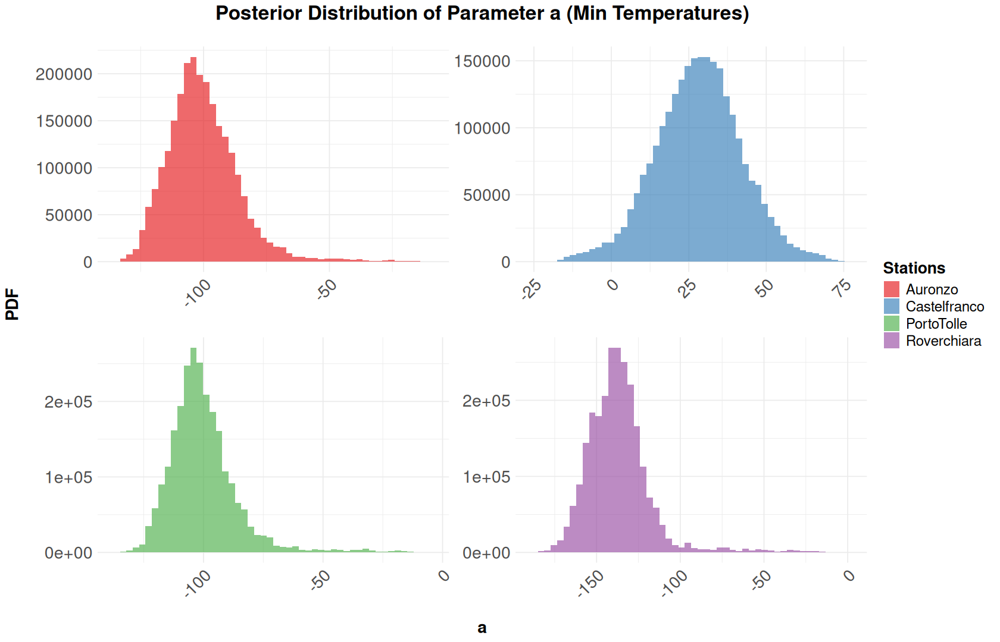

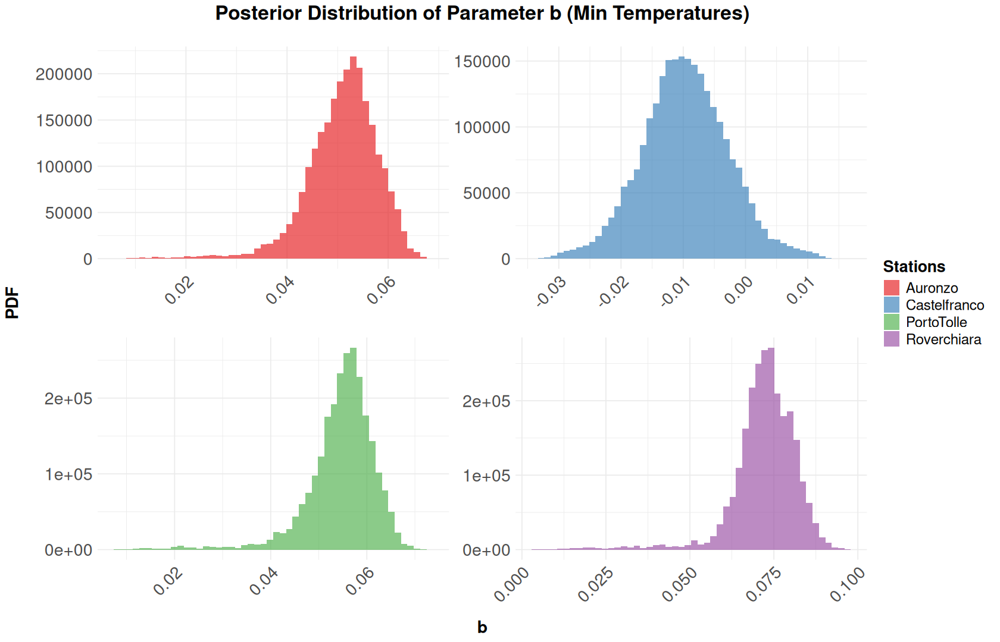

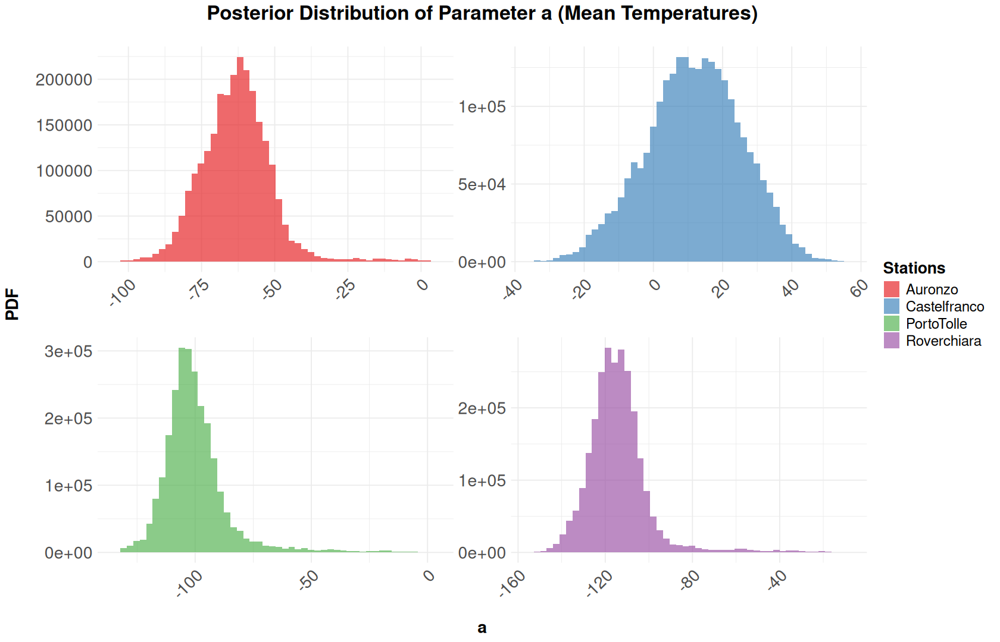

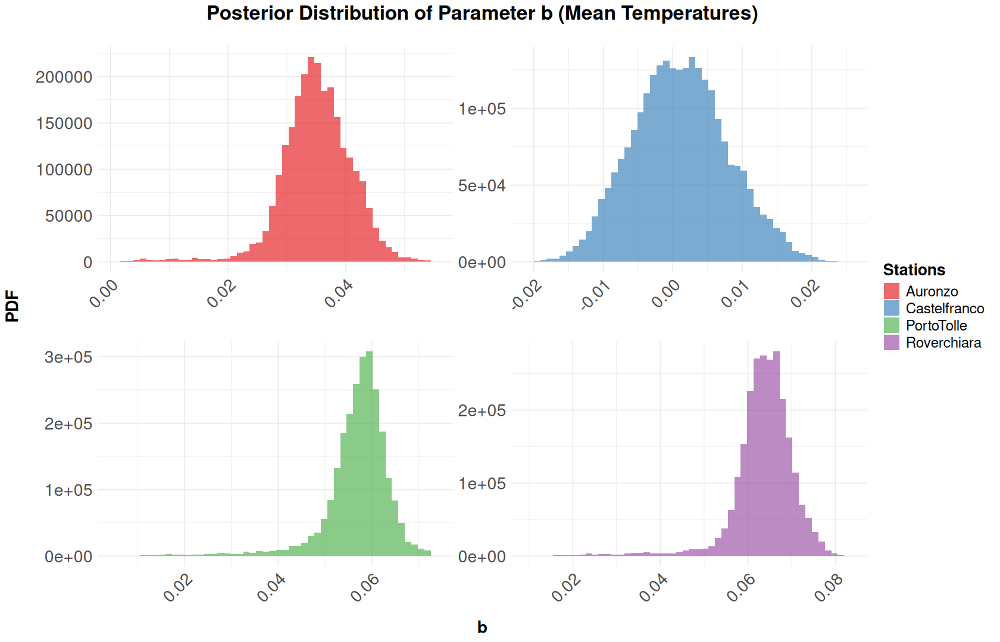

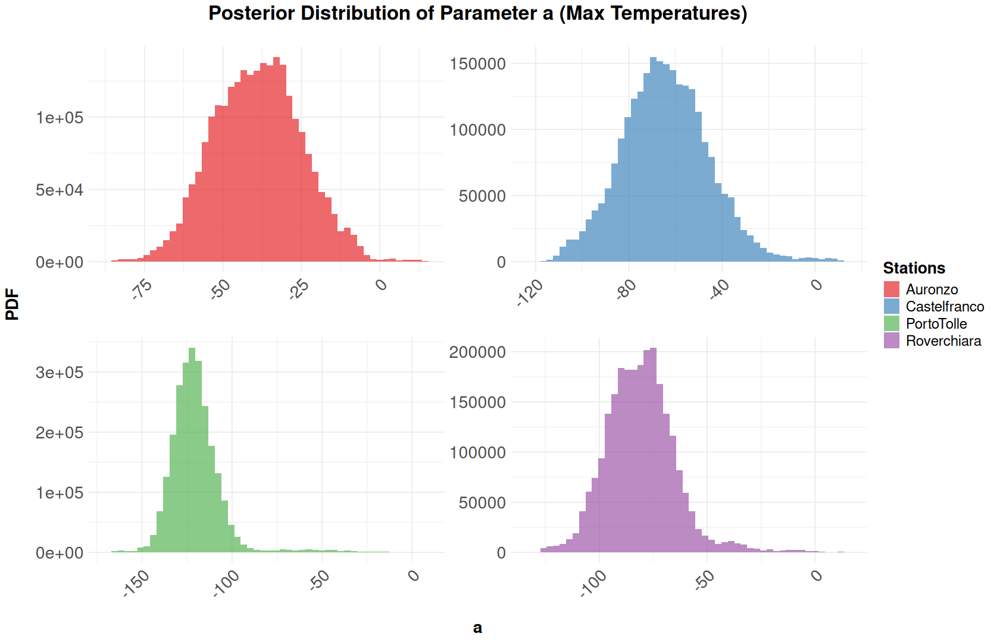

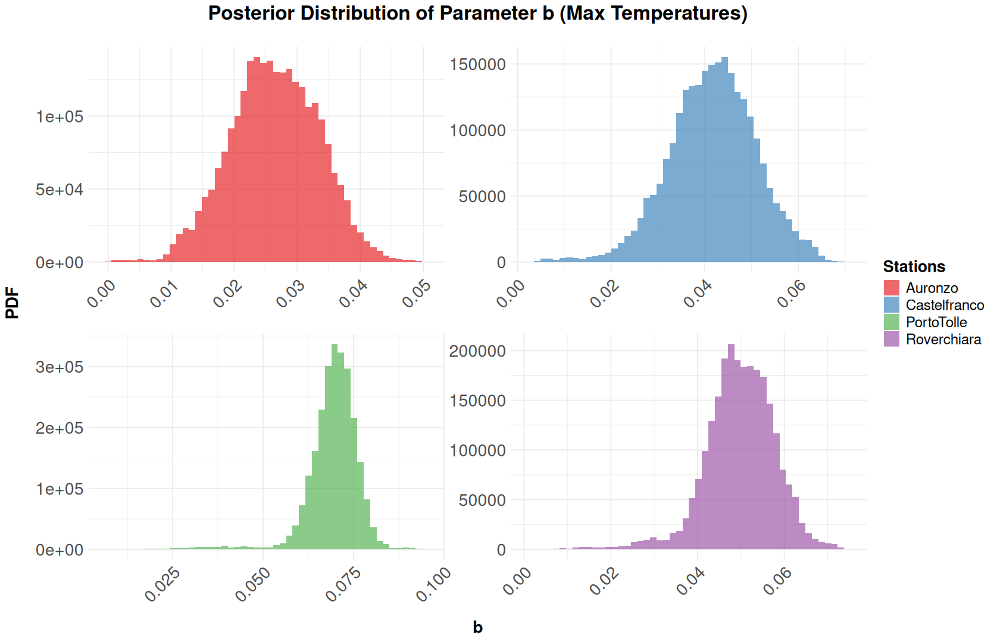

In [26]:
samples_long_min <- results$samples_jags_min %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_mean <- results$samples_jags_mean %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_max <- results$samples_jags_max %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")


options(repr.plot.width = 14, repr.plot.height=9)


theme_custom <- theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 17),
    axis.text.y = element_text(size = 17),
    axis.title.x = element_text(size = 17, face = "bold", margin = margin(t = 15)),
    axis.title.y = element_text(size = 17, face = "bold", margin = margin(r = 15)),
   # strip.text = element_text(size = 16, face = "bold"),
    legend.title = element_text(size = 16, face = "bold"),
    legend.text = element_text(size = 14.5)
  )

ggplot(filter(samples_long_min, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Min Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_min, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Min Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")


ggplot(filter(samples_long_mean, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Mean Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_mean, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Mean Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")


ggplot(filter(samples_long_max, parameter == "a"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter a (Max Temperatures)", x = "a", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

ggplot(filter(samples_long_max, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  labs(title = "Posterior Distribution of Parameter b (Max Temperatures)", x = "b", y = "PDF",fill="Stations") +
  facet_wrap(~ paese, scales = "free",labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

In [27]:
pred_jags_min<-results$pred_jags_min
pred_jags_mean<-results$pred_jags_mean
pred_jags_max<-results$pred_jags_max

We can also plot the fits and their errors:

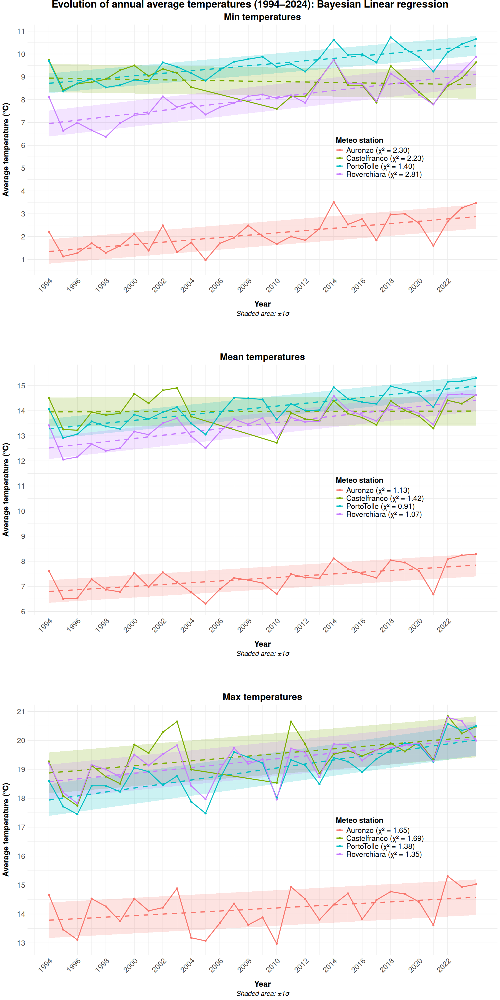

In [28]:
pred_jags_min$temp_type <- "min"
pred_jags_mean$temp_type <- "mean"
pred_jags_max$temp_type <- "max"   # merge the dataframes
pred_jags <- rbind(pred_jags_min, pred_jags_mean, pred_jags_max)

options(repr.plot.width = 15, repr.plot.height = 30)
min_lin_fit_plot <-plot_1(df_finale,pred_jags,"min",'Min temperatures',names_stat)
mean_lin_fit_plot <-plot_1(df_finale,pred_jags,"mean",'Mean temperatures',names_stat)
max_lin_fit_plot <-plot_1(df_finale,pred_jags,"max",'Max temperatures',names_stat)

grid.arrange(
  min_lin_fit_plot, nullGrob(), mean_lin_fit_plot, nullGrob(), max_lin_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2024): Bayesian Linear regression', 
                 gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" )
)

## 1.3)
Perform the same analysis using a constant regression.

We now perform a constant regression analysis with JAGS to compare the two models with a Bayesian hypothesis testing. 

In [ ]:
prior_min_const <- prior_min
prior_min_const$slope <- 0
prior_min_const$slope_se <- 1e6  # very vague prior on slope

prior_mean_const <- prior_mean
prior_mean_const$slope <- 0
prior_mean_const$slope_se <- 1e6

prior_max_const <- prior_max
prior_max_const$slope <- 0
prior_max_const$slope_se <- 1e6


const_results <- jags_analysis(
  model_type = "constant",
  df_min = df_min,
  df_mean = df_mean,
  df_max = df_max,
  prior_min = prior_min_const,
  prior_mean = prior_mean_const,
  prior_max = prior_max_const,
  names_stat = names_stat,
  n.chains = n.chains,
  n.burnin = n.burnin,
  n.iter = n.iter
)



In [68]:
str(const_results)

List of 7
 $ pred_jags_min    :'data.frame':	119 obs. of  6 variables:
  ..$ paese        : chr [1:119] "Roverchiara" "Roverchiara" "Roverchiara" "Roverchiara" ...
  ..$ Anno         : num [1:119] 1994 1995 1996 1997 1998 ...
  ..$ prediction   : num [1:119] 8.03 8.03 8.03 8.03 8.03 ...
  ..$ prediction_se: num [1:119] 0.901 0.901 0.901 0.901 0.901 ...
  ..$ chi_squared  : num [1:119] 6.6 6.6 6.6 6.6 6.6 ...
  ..$ temp_type    : chr [1:119] "min" "min" "min" "min" ...
 $ pred_jags_mean   :'data.frame':	119 obs. of  6 variables:
  ..$ paese        : chr [1:119] "Roverchiara" "Roverchiara" "Roverchiara" "Roverchiara" ...
  ..$ Anno         : num [1:119] 1994 1995 1996 1997 1998 ...
  ..$ prediction   : num [1:119] 13.5 13.5 13.5 13.5 13.5 ...
  ..$ prediction_se: num [1:119] 0.749 0.749 0.749 0.749 0.749 ...
  ..$ chi_squared  : num [1:119] 3.15 3.15 3.15 3.15 3.15 ...
  ..$ temp_type    : chr [1:119] "mean" "mean" "mean" "mean" ...
 $ pred_jags_max    :'data.frame':	119 obs. of  6 varia

In [30]:
plot_constant_fit <- function(df, pred_df, temp_type, title, names_stat) {
    
  # filter by temp type
    
  df <- df[df$tipo == temp_type,]     
  pred_df <- pred_df[pred_df$temp_type == temp_type,]  
  
  df$Anno <- as.numeric(as.character(df$Anno))
  pred_df$Anno <- as.numeric(as.character(pred_df$Anno))
  df$Medio <- as.numeric(as.character(df$Medio))
  pred_df$prediction <- as.numeric(as.character(pred_df$prediction))
  pred_df$prediction_se <- as.numeric(as.character(pred_df$prediction_se))
  

  chi_values <- pred_df |>
    group_by(paese) |>
    summarise(chi_squared = mean(chi_squared), .groups = "drop")
  
  legend_labels <- setNames(
    sprintf("%s (χ² = %.2f)", chi_values$paese, chi_values$chi_squared),
    chi_values$paese
  )
  
  ggplot() +
    # shaded ribbon for ±1σ
    geom_ribbon(data = pred_df, aes(x = Anno, ymin = prediction - prediction_se,
                                    ymax = prediction + prediction_se, fill = paese),alpha = 0.2, show.legend = FALSE) +
    # constant prediction line
    geom_line(data = pred_df, aes(x = Anno, y = prediction, color = paese), 
              size = 1.2, linetype = "dashed") +
    
    geom_line(data = df, aes(x = Anno, y = Medio, color = paese), size = 1) +
    geom_point(data = df, aes(x = Anno, y = Medio, color = paese)) +
    
    scale_color_discrete(labels = legend_labels) +
    labs(
      title = title,
      x = "Year",
      y = "Average temperature (°C)",
      color = "Meteo station",
      fill = NULL,
      caption = "Shaded area: ±1σ") +
    
    scale_x_continuous(breaks = seq(1994, 2023, 2)) +
    scale_y_continuous(breaks = seq(0, 21, 1)) +
    
    theme_minimal() +
    theme(
      plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
      axis.text.x = element_text(angle = 45, hjust = 1, size = 16),
      axis.text.y = element_text(size = 16),
      axis.title.x = element_text(size = 17, margin = margin(t = 15), face = "bold"),
      axis.title.y = element_text(size = 17, margin = margin(r = 15), face = "bold"),
      legend.position = c(0.8, 0.47),
      legend.title = element_text(size = 16, face = "bold"),
      legend.text = element_text(size = 16),
      plot.caption = element_text(size = 14, hjust = 0.5, face = "italic")) }


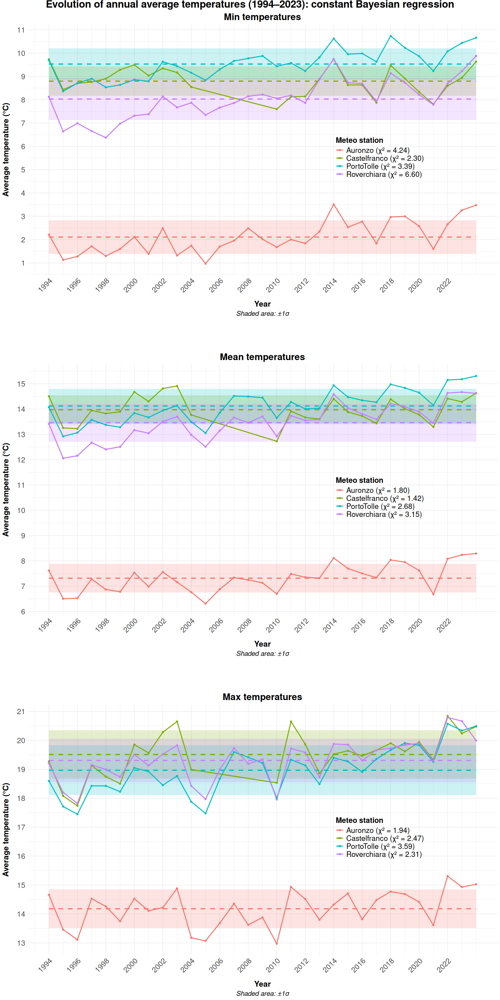

In [31]:
const_results$pred_jags_min$temp_type <- "min"
const_results$pred_jags_mean$temp_type <- "mean"
const_results$pred_jags_max$temp_type <- "max"

const_results$pred_jags <- rbind(
  const_results$pred_jags_min, 
  const_results$pred_jags_mean, 
  const_results$pred_jags_max)

options(repr.plot.width = 15, repr.plot.height = 30)

min_const_fit_plot <- plot_1(df_finale,const_results$pred_jags,"min","Min temperatures",  names_stat)
mean_const_fit_plot <-plot_1(df_finale,const_results$pred_jags,"mean",'Mean temperatures',names_stat)
max_const_fit_plot <-plot_1(df_finale,const_results$pred_jags,"max",'Max temperatures',names_stat)

grid.arrange(min_const_fit_plot, nullGrob(), mean_const_fit_plot, nullGrob(), max_const_fit_plot,
  ncol = 1,
  heights = c(1, 0.1, 1, 0.1, 1),
  top = textGrob('Evolution of annual average temperatures (1994–2023): constant Bayesian regression', gp = gpar(fontsize = 22, fontface = "bold", col = "black"), vjust=0.3,just="top" ))

## 1.4)

We now perform a Bayesian hypothesis testing with the posteriors obtained. The null hypothesis $H_0$ is the constant model, while the alternative hypothesis $H_1$ is the increasing linear trend. We can proceed in two ways.

- First, in the linear model, we compute a 95% confidence interval for the posterior of the slope b to test the null hypothesis $b=0$.

In [32]:
##

lower_lims_min <- results$samples_jags_min |> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_min <- results$samples_jags_min |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))

lower_lims_mean <- results$samples_jags_mean|> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_mean  <- results$samples_jags_mean |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))


lower_lims_max <- results$samples_jags_max |> group_by(paese) |> summarise(lower_lim = quantile(b,0.025, na.rm = TRUE))
upper_lims_max <- results$samples_jags_max |> group_by(paese) |> summarise(upper_lim = quantile(b,0.975, na.rm = TRUE))


lower_lims <- bind_rows("min"=lower_lims_min,'mean'=lower_lims_mean,"max"=lower_lims_max,.id='type')
upper_lims <- bind_rows("min"=upper_lims_min,'mean'=upper_lims_mean,"max"=upper_lims_max,.id='type')

lower_lims
upper_lims

type,paese,lower_lim
<chr>,<chr>,<dbl>
min,Auronzo,0.03490945
min,Castelfranco,-0.02341658
min,PortoTolle,0.03688903
min,Roverchiara,0.04787607
mean,Auronzo,0.02276975
mean,Castelfranco,-0.01160178
mean,PortoTolle,0.03675499
mean,Roverchiara,0.04528377
max,Auronzo,0.01236994


type,paese,upper_lim
<chr>,<chr>,<dbl>
min,Auronzo,0.062186860
min,Castelfranco,0.004610892
min,PortoTolle,0.065076298
min,Roverchiara,0.086648723
mean,Auronzo,0.045792403
mean,Castelfranco,0.015059709
mean,PortoTolle,0.066877461
mean,Roverchiara,0.074720441
max,Auronzo,0.039616225


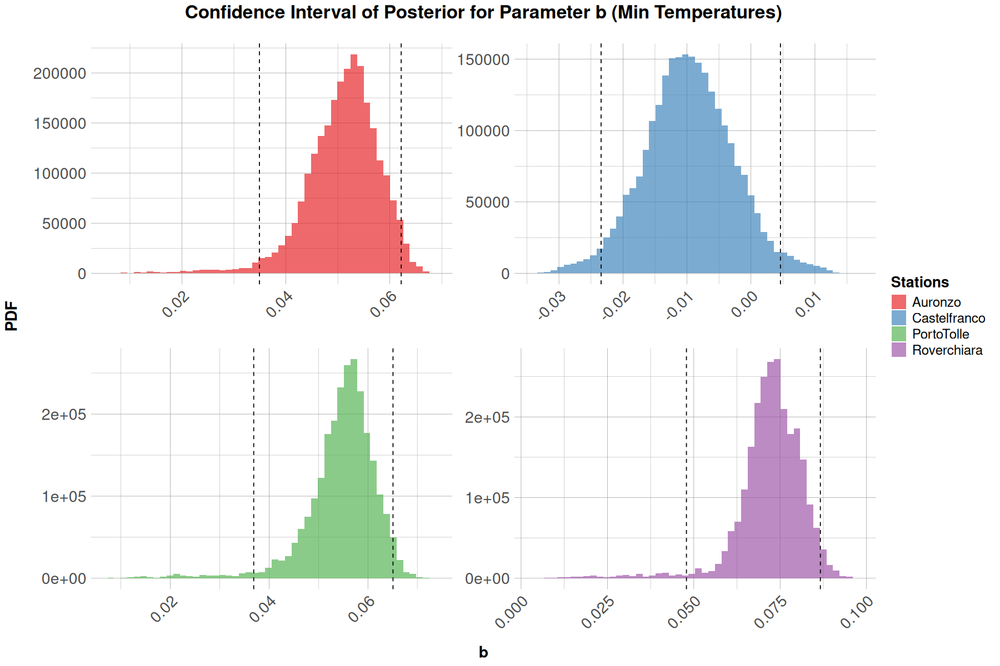

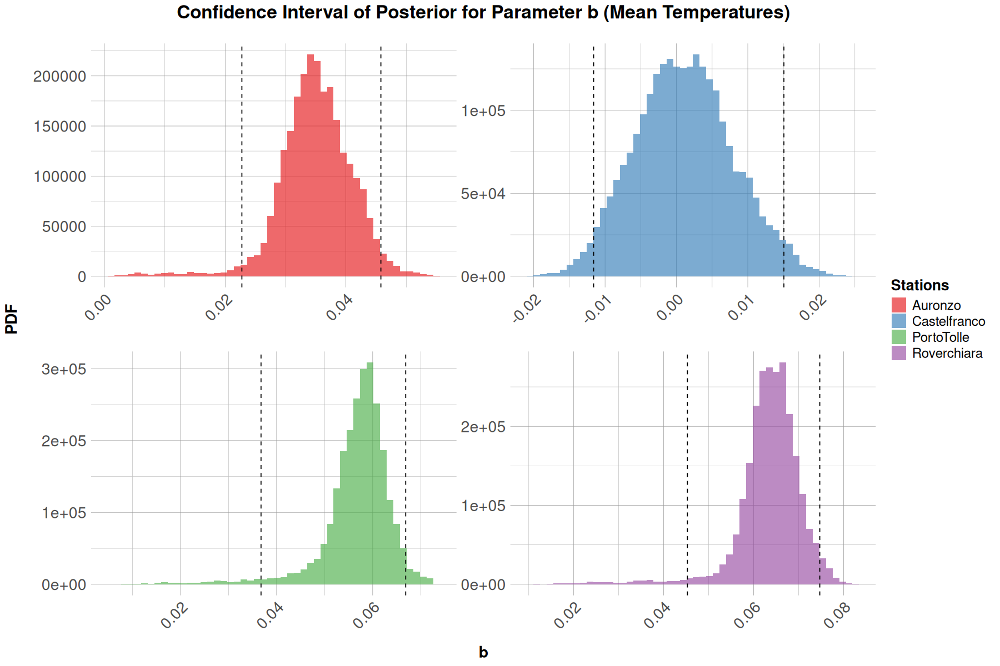

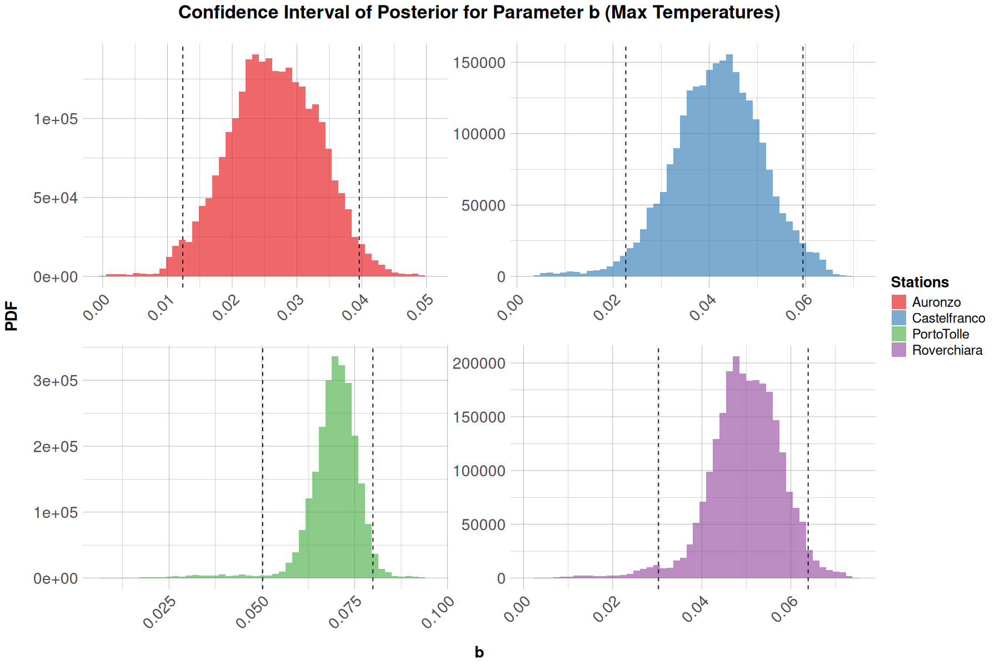

In [33]:
samples_long_min <- results$samples_jags_min %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_mean <- results$samples_jags_mean %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")

samples_long_max <- results$samples_jags_max %>%
   pivot_longer(cols = c("a", "b"), names_to = "parameter", values_to = "value")


theme_custom <- theme_minimal() +
  theme(
    plot.title = element_text(hjust = 0.5, size = 20, face = "bold"),
    axis.text.x = element_text(angle = 45, hjust = 1, size = 17),
    axis.text.y = element_text(size = 17),
    axis.title.x = element_text(size = 17, face = "bold", margin = margin(t = 15)),
    axis.title.y = element_text(size = 17, face = "bold", margin = margin(r = 15)),
    legend.title = element_text(size = 16, face = "bold"),
    legend.text = element_text(size = 14.5),
    
    # grid lines
    panel.grid.major = element_line(color = "grey60", size = 0.2),
    panel.grid.minor = element_line(color = "grey75", size = 0.2))



options(repr.plot.width = 15, repr.plot.height=10)


ggplot(filter(samples_long_min, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "min"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "min"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Min Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

                                                           
ggplot(filter(samples_long_mean, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "mean"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "mean"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Mean Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")
                                                           

ggplot(filter(samples_long_max, parameter == "b"), aes(x = value, fill = paese)) +
  geom_histogram(alpha = 0.65, bins = 50) +
  geom_vline(data = filter(lower_lims, type == "max"), 
             aes(xintercept = lower_lim), linetype = "dashed", color = "black") +
  geom_vline(data = filter(upper_lims, type == "max"), 
             aes(xintercept = upper_lim), linetype = "dashed", color = "black") +
  labs(title = "Confidence Interval of Posterior for Parameter b (Max Temperatures)", 
       x = "b", y = "PDF", fill = "Stations") +
  facet_wrap(~ paese, scales = "free", labeller = labeller(paese = function(x) "")) +
  theme_custom +
  scale_fill_brewer(palette = "Set1")

With the exception of minimum and mean temperatures in Castelfranco, $b=0$ is not included in the confidence interval and thus in such cases we can reject the null hypothesis of the constant model at significance $\alpha=5\%$.

- Another way to proceed is to compute the Bayes factor for the two models:
$$ BF = \frac{P(Data|H_1)}{P(Data|H_0)}$$

where we compute the likelihoods assuming a distribution $N(a+bx,\sigma^2)$ for $H_1$ and $N(a,\sigma^2)$ for $H_0$.

In [34]:
log_lik_sample <- function(a, b, sigma2, x, y) {
  x <- as.numeric(x)
  y <- as.numeric(y)
  mu <- a+ b*x
  sum(dnorm(y, mean = mu, sd = sqrt(sigma2),log = TRUE))
}

log_lik_sample_const <- function(a, sigma2, y) {
  y <- as.numeric(y)
  mu <- rep(a, length(y))
  sum(dnorm(y, mean = mu, sd = sqrt(sigma2),log = TRUE))
}


samples_linear_min <- as.data.frame(results$samples_jags_min)   
samples_const_min  <- as.data.frame(const_results$samples_jags_min)

samples_linear_min <- samples_linear_min |> filter(sigma>0)
samples_const_min <- samples_const_min |> filter(sigma>0)

samples_linear_mean <- as.data.frame(results$samples_jags_mean)   
samples_const_mean  <- as.data.frame(const_results$samples_jags_mean)

samples_linear_mean <- samples_linear_mean |> filter(sigma>0)
samples_const_mean <- samples_const_mean |> filter(sigma>0)

samples_linear_max <- as.data.frame(results$samples_jags_max)   
samples_const_max  <- as.data.frame(const_results$samples_jags_max)

samples_linear_max <- samples_linear_max |> filter(sigma>0)
samples_const_max <- samples_const_max |> filter(sigma>0)


log_marg_like <- function(log_liks) {
  m <- max(log_liks)
  m + log(mean(exp(log_liks - m)))
}


library(purrr)

stations <- unique(samples_linear_min$paese)
bf_results <- list()

for (st in stations) {
  
  s_lin_min   <- samples_linear_min |> filter(paese == st)
  s_const_min <- samples_const_min  |> filter(paese == st)

  s_lin_mean   <- samples_linear_mean |> filter(paese == st)
  s_const_mean <- samples_const_mean  |> filter(paese == st)

  s_lin_max   <- samples_linear_max |> filter(paese == st)
  s_const_max <- samples_const_max  |> filter(paese == st)

  df_station_min  <- df_min  |> filter(paese == st)
  x_min <- df_station_min$Anno
  y_min <- df_station_min$Medio

  df_station_mean <- df_mean |> filter(paese == st)
  x_mean <- df_station_mean$Anno
  y_mean <- df_station_mean$Medio

  df_station_max  <- df_max  |> filter(paese == st)
  x_max <- df_station_max$Anno
  y_max <- df_station_max$Medio

  log_liks_linear_min <- s_lin_min |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_min, y = y_min)
    }))

  log_liks_const_min <- s_const_min |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_min)
    }))

  log_liks_linear_mean <- s_lin_mean |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_mean, y = y_mean)
    }))

  log_lipreviousks_const_mean <- s_const_mean |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_mean)
    }))

  log_liks_linear_max <- s_lin_max |>
    mutate(loglik = pmap_dbl(list(a, b, sigma), ~ {
      log_lik_sample(a = ..1, b = ..2, sigma2 = ..3^2, x = x_max, y = y_max)
    }))

  log_liks_const_max <- s_const_max |>
    mutate(loglik = pmap_dbl(list(a, sigma), ~ {
      log_lik_sample_const(a = ..1, sigma2 = ..2^2, y = y_max)
    }))

  log_ml_linear_min <- log_marg_like(log_liks_linear_min$loglik)
  log_ml_const_min   <- log_marg_like(log_liks_const_min$loglik)

  log_ml_linear_mean <- log_marg_like(log_liks_linear_mean$loglik)
  log_ml_const_mean  <- log_marg_like(log_liks_const_mean$loglik)

  log_ml_linear_max  <- log_marg_like(log_liks_linear_max$loglik)
  log_ml_const_max   <- log_marg_like(log_liks_const_max$loglik)

  BF_min  <- exp(log_ml_linear_min - log_ml_const_min)
  BF_mean <- exp(log_ml_linear_mean - log_ml_const_mean)
  BF_max  <- exp(log_ml_linear_max - log_ml_const_max)

  bf_results[[st]] <- list(
    BF_min = BF_min,
    BF_mean = BF_mean,
    BF_max = BF_max
  )
}


In [35]:
bf_results <- bind_rows(lapply(names(bf_results), function(st) {
    data.frame(
      paese = st,
      BF_min = bf_results[[st]]$BF_min,
      BF_mean = bf_results[[st]]$BF_mean,
      BF_max = bf_results[[st]]$BF_max) }))
bf_results

paese,BF_min,BF_mean,BF_max
<chr>,<dbl>,<dbl>,<dbl>
Roverchiara,1.822081e+06,1.841811e+07,1.850476e+03
Castelfranco,1.616190e+00,8.420985e-01,8.124880e+01
PortoTolle,1.002307e+06,1.294414e+07,1.411975e+06
Auronzo,1.282067e+04,1.124888e+03,1.112721e+01


Coherently with previous results, a constant model $H_0$ is more likely than a linear model $H_1$ only for mean temperatures in Castelfranco, and again low values of $BF$ (not strong evidence for linear model) are obtained for minimum temperatures in Castelfranco and maximum temperatures in Auronzo. In all other cases, the linear model $H_1$ is much more likely than the constant model $H_0$. 

## 1.5)
Do you see correlations between data measured at different stations?

We calculate the correlation between minimum, mean and maximum temperatures across different pairs of stations, excluding Castelfranco Veneto due to missing data. In particular, we compute the "cumulative" correlation, considering all data up to each given day.

In [36]:
#Roverchiara-Porto Tolle

df <- df_94 |> filter(paese %in% c("Roverchiara","PortoTolle")) |> arrange(date)
df_wide <- df |> pivot_wider(names_from = paese,values_from = c(TMIN,TMED,TMAX))
dates <- unique(df$date)
n <- length(dates)

corr_df_RP <- map_dfr(2:n, function(i){

data <- df_wide[1:i, ]

tibble(
    date = df_wide$date[i],
    corr_min = cor(data$TMIN_Roverchiara, data$TMIN_PortoTolle, use = "complete.obs"),
    corr_mean = cor(data$TMED_Roverchiara, data$TMED_PortoTolle, use = "complete.obs"),
    corr_max = cor(data$TMAX_Roverchiara, data$TMAX_PortoTolle, use = "complete.obs")) })              

In [71]:
head(corr_df_RP)

date,corr_min,corr_mean,corr_max
<date>,<dbl>,<dbl>,<dbl>
1994-01-02,1.0000000,1.0000000,-1.00000000
1994-01-03,0.9821231,0.9722129,-0.80856863
1994-01-04,0.9713297,0.7682945,-0.29518660
1994-01-05,0.8153975,0.4644701,-0.03843073
1994-01-06,0.7822183,0.8196297,0.45795943
1994-01-07,0.9039757,0.9078058,0.66575916


In [38]:
#Roverchiara-Auronzo

df <- df_94 |> filter(paese %in% c("Roverchiara","Auronzo")) |> arrange(date)
df_wide <- df |> pivot_wider(names_from = paese,values_from = c(TMIN,TMED,TMAX))
dates <- unique(df$date)
n<- length(dates)

corr_df_RA <- map_dfr(2:n, function(i) {

data <- df_wide[1:i, ]

tibble(
    date = df_wide$date[i],
    corr_min = cor(data$TMIN_Roverchiara, data$TMIN_Auronzo, use = "complete.obs"),
    corr_mean = cor(data$TMED_Roverchiara, data$TMED_Auronzo, use = "complete.obs"),
    corr_max = cor(data$TMAX_Roverchiara, data$TMAX_Auronzo, use = "complete.obs") )
})              

In [69]:
head(corr_df_RA)

date,corr_min,corr_mean,corr_max
<date>,<dbl>,<dbl>,<dbl>
1994-01-02,1.0000000,1.0000000,-1.0000000
1994-01-03,0.6105720,0.9018759,0.5801178
1994-01-04,0.6991804,0.7690111,0.6182627
1994-01-05,0.7750287,0.7666076,0.2639864
1994-01-06,0.8786998,0.8318292,0.2824936
1994-01-07,0.9007856,0.8244284,0.3491032


In [40]:
#Porto Tolle-Auronzo

df <- df_94 |> filter(paese %in% c("PortoTolle","Auronzo")) |> arrange(date)
df_wide <- df |> pivot_wider(names_from = paese,values_from = c(TMIN,TMED,TMAX))
dates <- unique(df$date)
n <- length(dates)

corr_df_PA <- map_dfr(2:n, function(i) {

data <- df_wide[1:i,]

tibble(
    date = df_wide$date[i],
    corr_min = cor(data$TMIN_PortoTolle, data$TMIN_Auronzo, use = "complete.obs"),
    corr_mean = cor(data$TMED_PortoTolle, data$TMED_Auronzo, use = "complete.obs"),
    corr_max = cor(data$TMAX_PortoTolle, data$TMAX_Auronzo, use = "complete.obs") )
})              

In [70]:
head(corr_df_PA)

date,corr_min,corr_mean,corr_max
<date>,<dbl>,<dbl>,<dbl>
1994-01-02,1.0000000,1.0000000,1.00000000
1994-01-03,0.7487354,0.7756860,0.01020749
1994-01-04,0.8027971,0.7913590,0.17987235
1994-01-05,0.5167912,0.1722997,-0.57662877
1994-01-06,0.5709158,0.5547950,-0.34650394
1994-01-07,0.7149319,0.6883950,-0.15221395


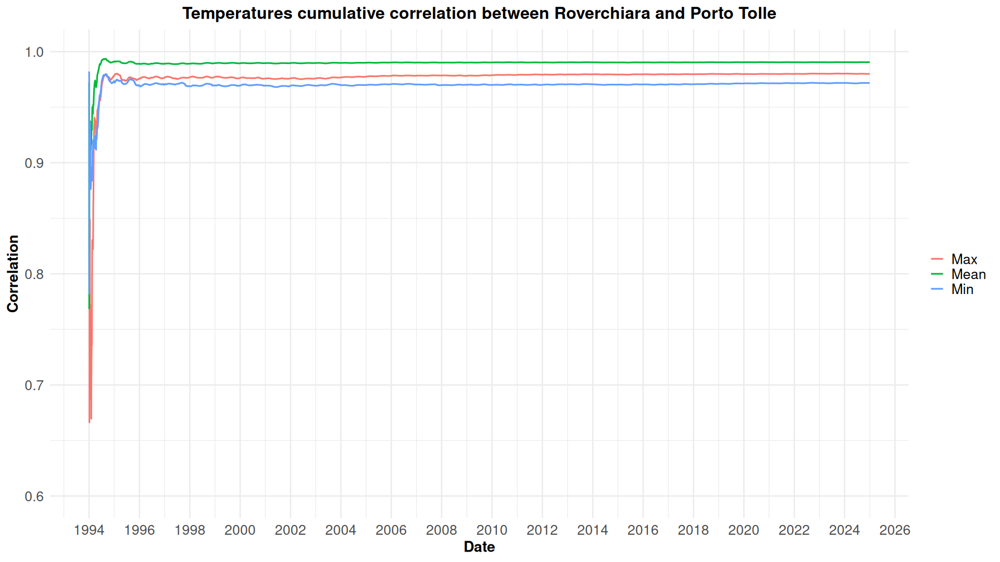

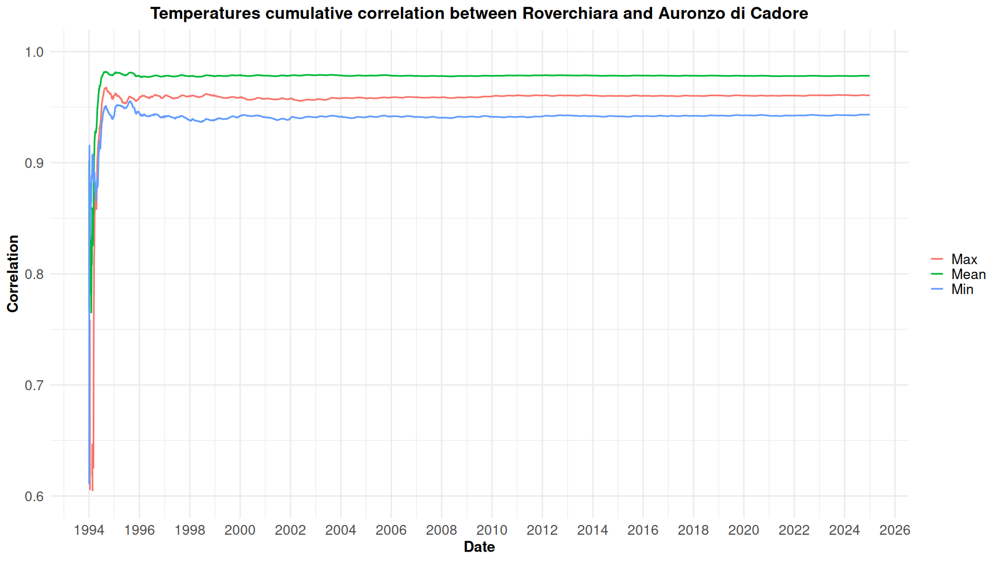

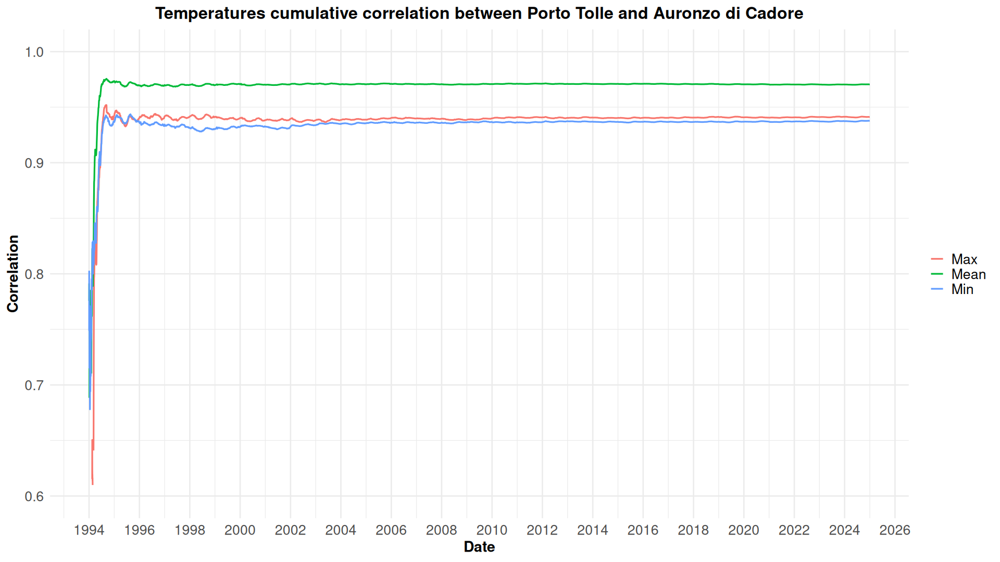

In [42]:
#plots

corr_df_long_RP <- corr_df_RP |> filter(corr_min!=1) |>
  mutate(date = dates[2:length(corr_df_PA$corr_min)]) |>
  pivot_longer(cols = c(corr_min, corr_mean, corr_max),
               names_to = "type", values_to = "correlation")

corr_df_long_RA <- corr_df_RA |> filter(corr_min!=1) |>
  mutate(date = dates[2:length(corr_df_PA$corr_min)]) |>
  pivot_longer(cols = c(corr_min, corr_mean, corr_max),
               names_to = "type", values_to = "correlation")

corr_df_long_PA <- corr_df_PA |> filter(corr_min!=1) |>
  mutate(date = dates[2:length(corr_df_PA$corr_min)]) |>
  pivot_longer(cols = c(corr_min, corr_mean, corr_max),
               names_to = "type", values_to = "correlation")


theme_custom <- theme_minimal(base_size = 16) + 
  theme(
    plot.title = element_text(face = "bold", hjust = 0.5),
    axis.text = element_text(size = 16),
    axis.title = element_text(size = 17,face="bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 16))
   # legend.position = "bottom")

options(repr.plot.width = 16, repr.plot.height=9)

ggplot(corr_df_long_RP, aes(x = date, y = correlation, color = type)) +
  geom_line(size = 0.9) +
scale_color_discrete(
    labels = c("corr_min" = "Min", "corr_mean" = "Mean", "corr_max" = "Max"))+
  scale_y_continuous(limits = c(0.6, 1), breaks = seq(0, 1, 0.1)) +  
  scale_x_date(date_breaks = "2 years", date_labels = "%Y") +    
  labs(
    title = "Temperatures cumulative correlation between Roverchiara and Porto Tolle",
    x = "Date",
    y = "Correlation",
    color = "Temperature"
  ) + theme_custom

ggplot(corr_df_long_RA, aes(x = date, y = correlation, color = type)) +
  geom_line(size = 0.9) +
 scale_color_discrete(
    labels = c("corr_min" = "Min", "corr_mean" = "Mean", "corr_max" = "Max"))+
  scale_y_continuous(limits = c(0.6, 1), breaks = seq(0, 1, 0.1)) +  
  scale_x_date(date_breaks = "2 years", date_labels = "%Y") +    
  labs(
    title = "Temperatures cumulative correlation between Roverchiara and Auronzo di Cadore",
    x = "Date",
    y = "Correlation",
    color = "Temperature"
  ) + theme_custom

ggplot(corr_df_long_PA, aes(x = date, y = correlation, color = type)) +
  geom_line(size = 0.9) +
    scale_color_discrete(
    labels = c("corr_min" = "Min", "corr_mean" = "Mean", "corr_max" = "Max"))+
  scale_y_continuous(limits = c(0.6, 1), breaks = seq(0, 1, 0.1)) +  
  scale_x_date(date_breaks = "2 years", date_labels = "%Y") +    
  labs(
    title = "Temperatures cumulative correlation between Porto Tolle and Auronzo di Cadore",
    x = "Date",
    y = "Correlation",
    color = "Temperature"
  ) + theme_custom


As expected, given the relatively short distance between the stations on a weather and climate scale, temperatures are highly correlated across them. Roverchiara and Porto Tolle exhibit the strongest correlation, as they are the closest geographically, while the correlation between Porto Tolle and Auronzo di Cadore is slightly lower, likely due to the greater distance and the distinct geographic settings (Porto Tolle being near the coast and Auronzo located in the mountains).

# 2) Analysis of the evolution of the annual difference of the min, max and daily average temperature over time (1993 - 2021):
Assuming you found an increasing trend in the temperature, compute it considering 4-years intervals and compare the results with those shown in SNPA (Sistema Nazionale per la Protezione Ambiente) in [1].

As seen previously, there is a clear increasing trend for the temperature over the years. We now want to compute them with respect to the absolute mean over all data points and study their trend during the years. 

In [43]:
## version without 'Medio mensile'

df_anni <- df_finale %>% 
  filter(Anno != "Medio mensile") %>%
  mutate(Anno = as.numeric(Anno),Medio = as.numeric(Medio))

df_min <- df_anni %>% 
  filter(tipo == "min")
df_max <- df_anni %>% 
  filter(tipo == "max")
df_mean <- df_anni %>% 
  filter(tipo == "mean")

head(df_anni)
paesi <- unique(df_anni$paese)
tipi <- unique(df_anni$tipo)

paese,Anno,tipo,GEN,FEB,MAR,APR,MAG,GIU,LUG,AGO,SET,OTT,NOV,DIC,Medio,std
<chr>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,1994,min,-6.262461,-6.007143,-0.716129,0.500000,5.619355,7.42000,10.38368,10.285742,8.206667,1.622581,0.4133333,-4.909677,2.212995,1.766283
Auronzo,1994,mean,-2.309919,-1.554832,5.529810,5.949313,11.881345,14.83164,17.54613,17.493897,13.138443,6.734687,3.9545600,-1.769019,7.618837,2.112294
Auronzo,1994,max,3.456503,5.128571,14.270968,12.413333,18.435484,22.57333,26.44668,26.264629,19.890000,13.819355,9.7900000,3.470968,14.663319,2.382074
Auronzo,1995,min,-10.025806,-4.214286,-4.019355,0.580000,4.790323,7.64000,11.26129,9.070968,5.366667,1.887097,-3.0666667,-5.700000,1.130853,1.915043
Auronzo,1995,mean,-5.195171,-0.084600,1.274635,6.929273,10.950977,13.23611,18.24923,14.994971,10.571880,8.024474,1.4511200,-2.340935,6.505163,2.141889
Auronzo,1995,max,1.687097,6.346429,8.209677,14.466667,17.970968,19.80667,26.65806,22.548387,17.496667,17.416129,7.3066667,1.619355,13.461064,2.376033


In [44]:
# this function computes residuals for each year
compute_residuals <- function(data, paese = NULL, tipo) {
  # paese filtering
  if (!is.null(paese)) {
    data <- data[data$paese == paese, ]
  }

  all_years <- seq(min(data$Anno), max(data$Anno), 1)

  # tipo filtering
  sel_data <- data[data$tipo == tipo, ]

  if (nrow(sel_data) == 0) {
    return(rep(NA, length(all_years)))
  }

  months <- c("GEN","FEB","MAR","APR","MAG","GIU","LUG","AGO","SET","OTT","NOV","DIC")

  yearly_average <- rowMeans(sel_data[, months], na.rm = TRUE) # average temperature for each year

  tot_average <- mean(as.matrix(sel_data[, months]), na.rm = TRUE) # total average on all years

  residuals <- rep(NA, length(all_years)) # prepare residual vector
  names(residuals) <- all_years

  matched_idx <- match(sel_data$Anno, all_years) # map existing data to years

  residuals[matched_idx] <- yearly_average - tot_average # compute residuals

  return(residuals)
}

In [45]:
# store results
n_rows <- length(paesi) * length(tipi)
years <- seq(min(df_anni$Anno), max(df_anni$Anno), 1)
#length(years)
df_residuals <- data.frame(matrix(0, nrow = n_rows, ncol = 2 + length(years)))
colnames(df_residuals) <- c("paese", "tipo", years)

# row counter
row_idx <- 1

# for over paesi
for (i in 1:length(paesi)){
    # for over tipi
    for (j in 1:length(tipi)){
        sel_paese <- paesi[i]
        sel_tipo <- tipi[j]

        # compute residuals and save
        residuals <- compute_residuals(df_anni,sel_paese,sel_tipo)
        df_residuals[row_idx, 1] <- sel_paese
        df_residuals[row_idx, 2] <- sel_tipo
        df_residuals[row_idx, 3:ncol(df_residuals)] <- residuals
        row_idx <- row_idx + 1
    }
}
head(df_residuals)

paese,tipo,1994,1995,1996,1997,1998,1999,2000,2001,⋯,2015,2016,2017,2018,2019,2020,2021,2022,2023,2024
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Auronzo,min,0.10125585,-0.9808870,-0.83564690,-0.40030197,-0.81682846,-0.51409997,0.003374363,-0.72349468,⋯,0.42095891,0.661927117,-0.27616353,0.8584721,0.88708731,0.4670902,-0.51144572,0.5461833,1.1494235,1.3660349
Auronzo,mean,0.29938786,-0.8142860,-0.79370544,-0.03800158,-0.44999093,-0.53874906,0.215943856,-0.33819441,⋯,0.38089196,0.184940356,0.02007440,0.7191234,0.63115723,0.2996011,-0.63839260,0.7637446,0.9169126,0.9712369
Auronzo,max,0.48209435,-0.7201600,-1.07325238,0.34812850,0.07993981,-0.43222928,0.347428218,-0.07230253,⋯,0.52813874,-0.362677480,0.29953331,0.5927881,0.50586723,0.2341107,-0.56767795,1.1259102,0.7507008,0.8433102
Castelfranco,min,0.93533437,-0.3663681,-0.09429666,-0.03700946,0.10120098,0.49032989,0.698310866,0.23608321,⋯,-0.16321338,-0.163308217,-0.92466883,0.6744914,0.11582296,-0.4647481,-0.99012902,-0.1984540,0.1422500,0.8349077
Castelfranco,mean,0.53011760,-0.7168192,-0.75031778,-0.02460590,-0.14922444,-0.07630681,0.702872802,0.32705181,⋯,-0.08660539,-0.244219337,-0.53611896,0.4163532,0.03905602,-0.1950295,-0.67794563,0.4422400,0.3113958,0.6584874
Castelfranco,max,-0.24268436,-1.4348554,-1.77392410,-0.37978754,-0.76723505,-1.01052870,0.339849538,0.05043520,⋯,0.12822514,-0.050404448,0.14796144,0.3856845,0.10315319,0.4289980,-0.18490722,1.3263927,0.7245116,0.9638268
PortoTolle,min,0.15113358,-1.1753587,-0.82355540,-0.63514074,-1.00224344,-0.90056381,-0.676197846,-0.74649512,⋯,0.41760718,0.448325390,0.09189779,1.1977513,0.69040410,0.3301383,-0.30519578,0.5401614,0.8963928,1.1216717
PortoTolle,mean,-0.05381860,-1.2086781,-1.06320402,-0.55400777,-0.75451309,-0.84584680,-0.282999128,-0.45950487,⋯,0.34647024,0.215398145,0.14105526,0.8471471,0.70907736,0.5206313,0.01758819,1.0201312,1.0509284,1.1772553
PortoTolle,max,-0.37818994,-1.2617010,-1.52901429,-0.54778864,-0.54767092,-0.74935162,0.075302540,-0.05424546,⋯,0.29160624,-0.070141780,0.37948095,0.6907764,0.92885479,0.8557460,0.28420061,1.5953155,1.3648304,1.5164442


In [46]:
# function for plotting the results
plot_residuals <- function(df_residuals, paese, tipo){
    data <- df_residuals[df_residuals$paese == paese & df_residuals$tipo == tipo,]
    x <- as.numeric(names(data)[3:length(names(data))])
    y <- as.matrix(data[1,3:ncol(data)])

    # setup color
    tipo_colors <- c("min" = "blue", "mean" = "darkgreen", "max" = "red")
    line_color <- tipo_colors[tipo]
    
    options(repr.plot.width = 8, repr.plot.height = 5)
    plot(x, y, type = 'l', main = paste('residuals of',paese,tipo,'temperature'),
        lwd = 3, xlab = 'years', ylab = 'residuals', col = line_color)
    abline(h=0, lty = 'dotted', col = 'black', alpha = 1)
    grid(col = 'gray', lty = 'dotted')
}

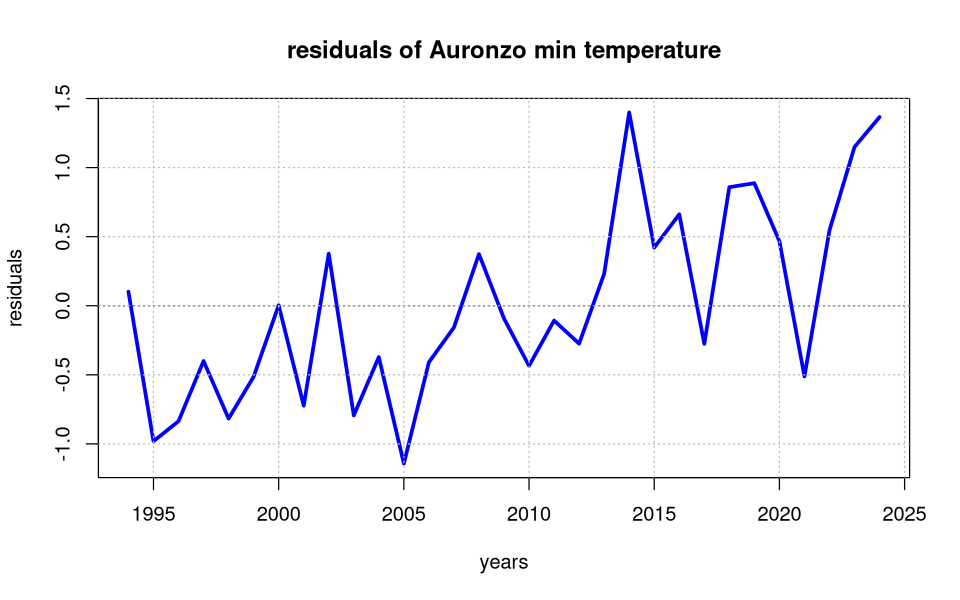

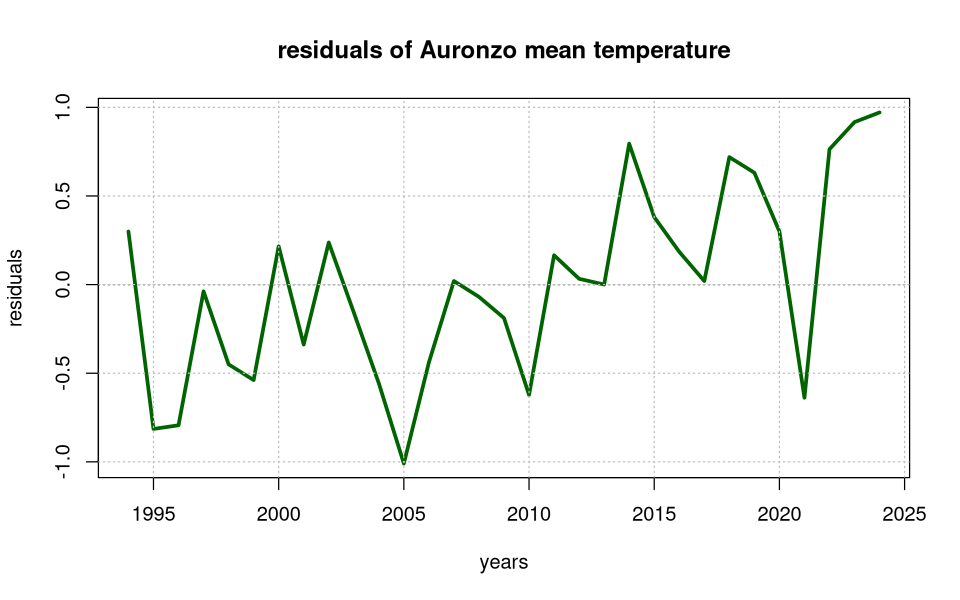

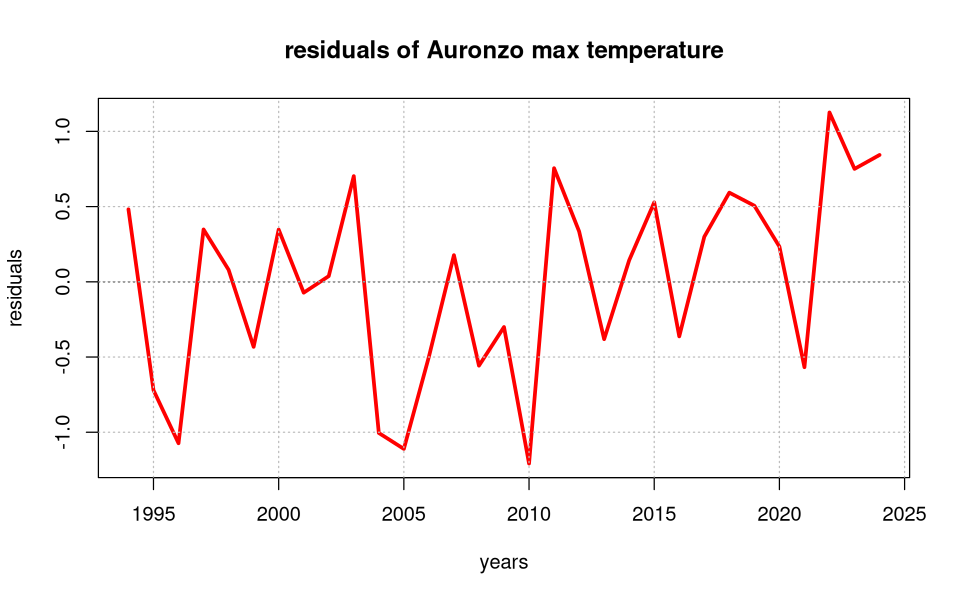

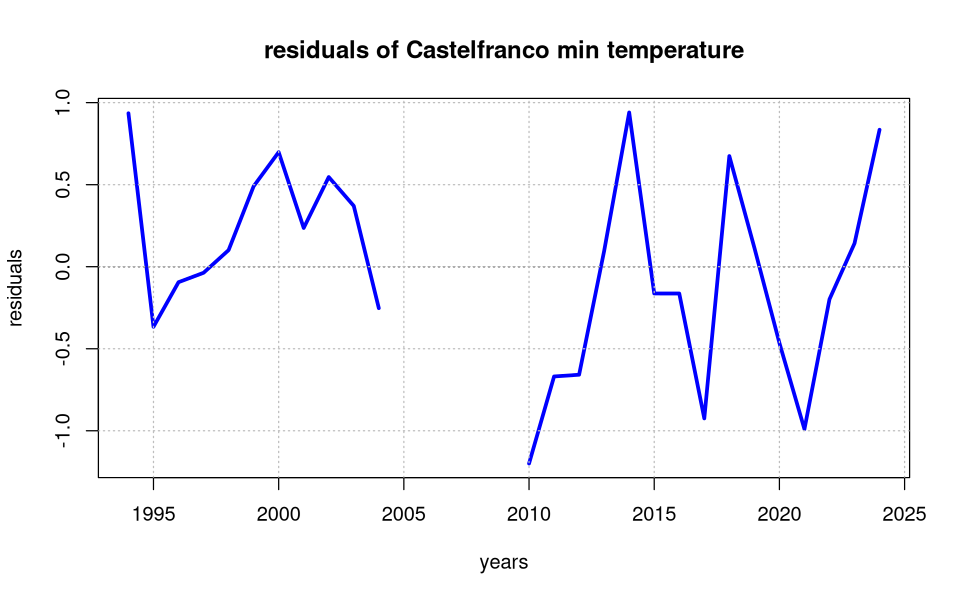

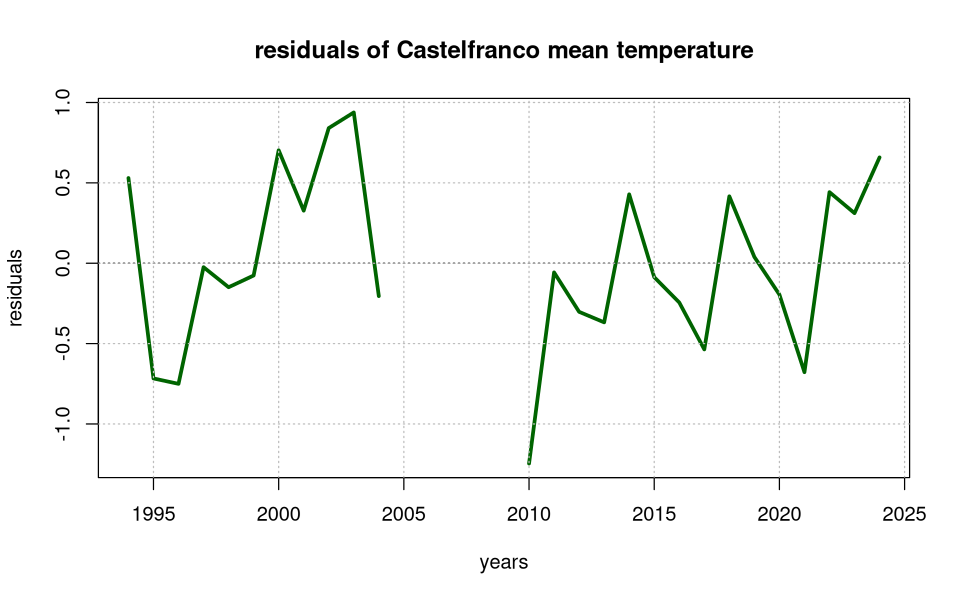

...

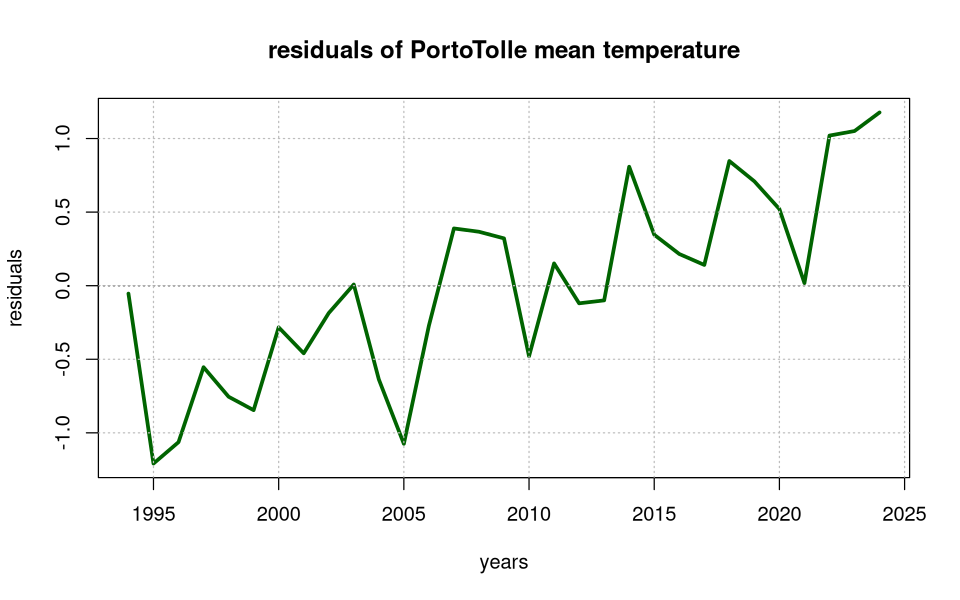

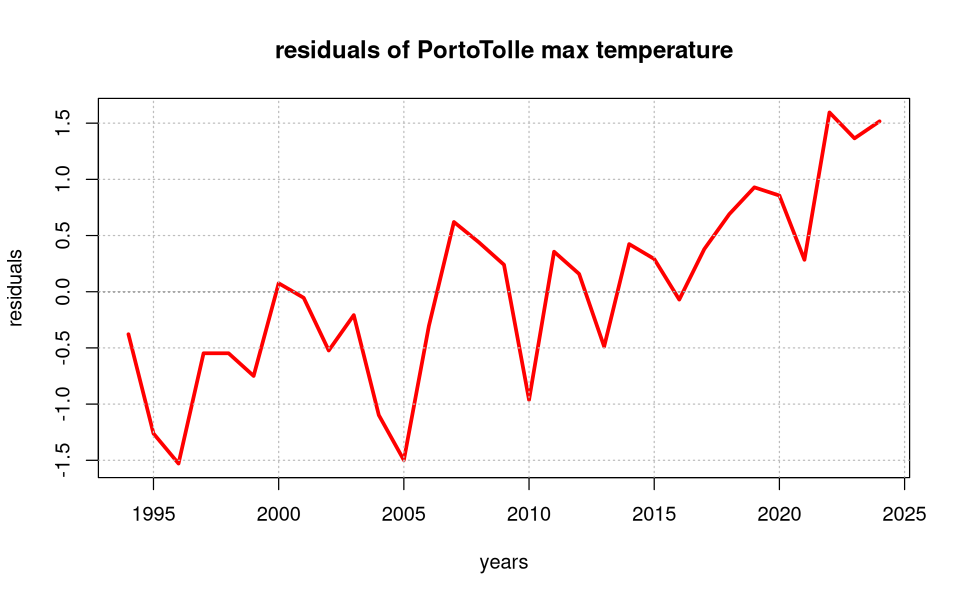

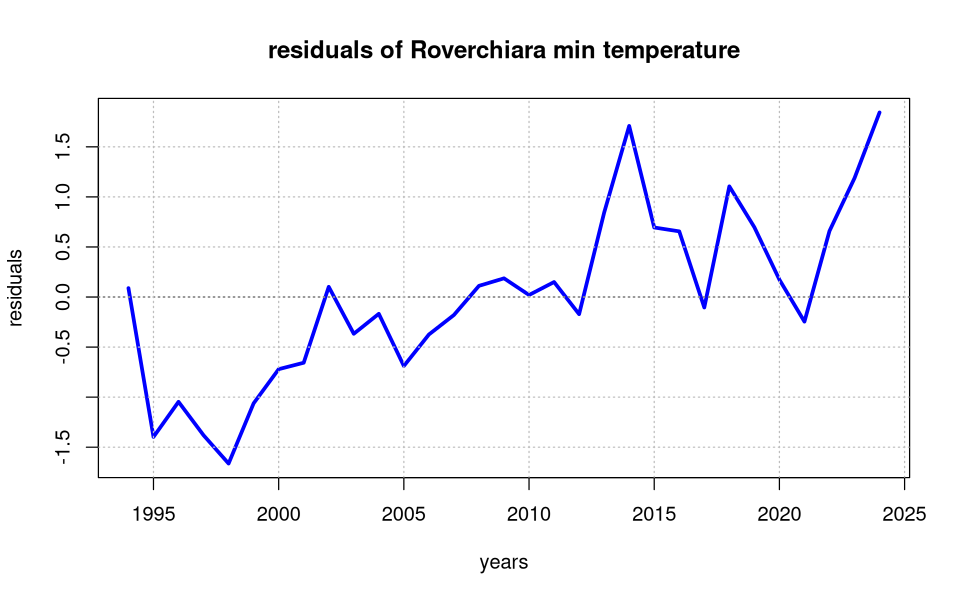

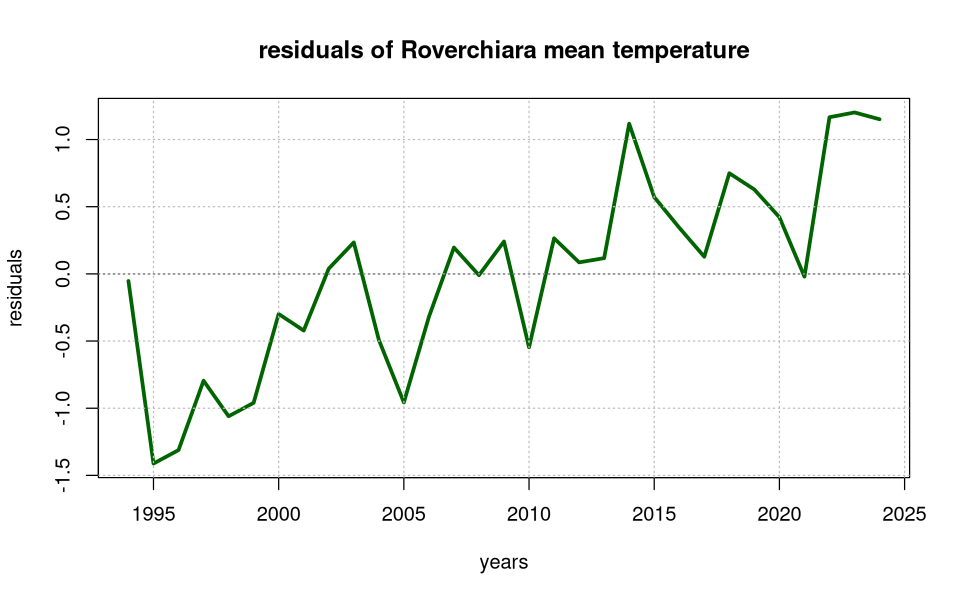

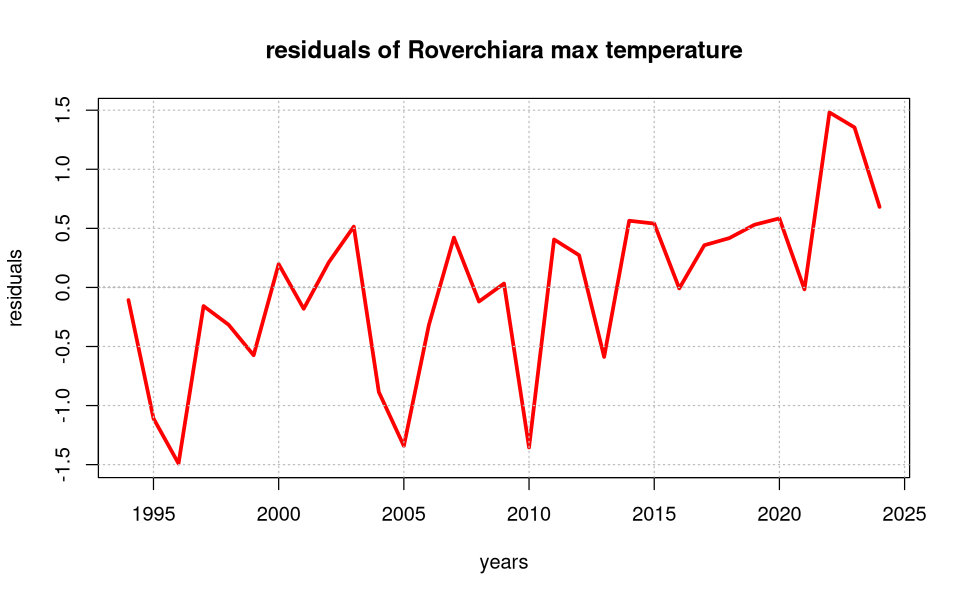

In [47]:
# plot logic 
for (paese in paesi){
    for (tipo in tipi){
        plot_residuals(df_residuals, paese, tipo)
    }
}    
  

Now we make a comparison with SNPA results:
https://www.snpambiente.it/wp-content/uploads/2021/06/Rapporto-SNPA-21_2021.pdf

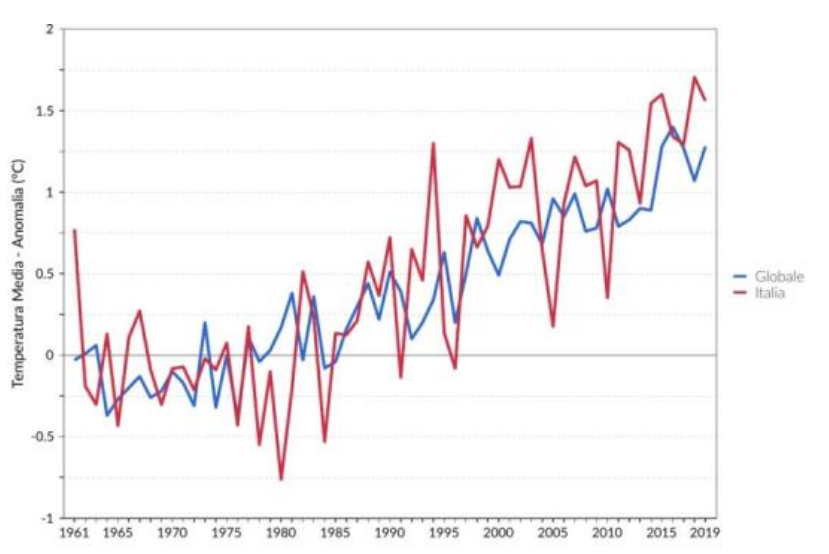

In [48]:
library("IRdisplay")
display_png(file = "/home/samu/AdvStats/Project/SNPA.png", width = 600)

Roughly speaking, we see that the overall trend found in our data is consistent with the one presented in the SNPA 2021 annual report (in particular in Roverchiara and Porto Tolle plots), with a clear growth over time of the temperature anomaly.

The comparsion between our results and SNPA is not very meaningful, since the datasets present major differences (for example, SNPA data relates to many more geographical zones).

To provide a more meaningful comparison between the two datasets, we compared the average annual temperature increase estimated by the SNPA with our own estimates derived using a linear JAGS model
According to the SNPA, the change in average temperature from 1981 to 2019 is equivalent to an increase every 10 years of: 
$\frac{\Delta T}{10 Y} = + 0.38 \pm 0.05\,^\circ\mathrm{C}$

In [49]:
dt_estimates <- c()
dt_errors <- c()
for (paese in paesi){
    data <- results$samples_jags_mean[results$samples_jags_mean$paese == paese,]
    b <- data[,'b']
    dt_estimate <- mean(b) * 10
    dt_error <- sd(b) * 10
    cat('For',paese,'mean temperature increase in 10 years is, on JAGS \n')
    cat(dt_estimate,'+-',dt_error,'\n\n')

    # save results
    dt_estimates <- c(dt_estimates,dt_estimate)
    dt_errors <- c(dt_errors,dt_error)
}

For Auronzo mean temperature increase in 10 years is, on JAGS 
0.3502293 +- 0.06055246 

For Castelfranco mean temperature increase in 10 years is, on JAGS 
0.01109498 +- 0.06850815 

For PortoTolle mean temperature increase in 10 years is, on JAGS 
0.5678835 +- 0.07196273 

For Roverchiara mean temperature increase in 10 years is, on JAGS 
0.6350362 +- 0.07271343 



According to JAGS simulations, the results for the increase of temperature depend on the zone:

- Auronzo di Cadore:
$\frac{\Delta T}{10 Y}= + 0.35 \pm 0.06\,^\circ\mathrm{C}$

- Castelfranco Veneto:
$\frac{\Delta T}{10 Y}= 0.01 \pm 0.07\,^\circ\mathrm{C}$


- Porto Tolle:
$\frac{\Delta T}{10 Y}= + 0.57 \pm 0.07\,^\circ\mathrm{C}$


- Roverchiara:
$\frac{\Delta T}{10 Y}= + 0.64 \pm 0.07\,^\circ\mathrm{C}$

We will exclude the result for Castelfranco Veneto, as the dataset is missing a substantial amount of data and fit results could be not representative of the actual situation. 



In [50]:
SNPA_estimate <- 0.38
SNPA_error <- 0.05
SNPA_n <- 2019 - 1981
dt_n <- length(years)

# compute t-statistic
t.stat <- (SNPA_estimate - dt_estimates) / sqrt((SNPA_error^2) + dt_errors^2)

# degrees of freedom
df <- ( (SNPA_error^2/SNPA_n + dt_errors^2/dt_n)^2 ) / 
      ( ((SNPA_error^2/SNPA_n)^2)/(SNPA_n-1) + ((dt_errors^2/dt_n)^2)/(dt_n-1) )

# p value
p.value <- 2 * pt(-abs(t.stat), df)

# 0.05 significance test
cat('Stations for which the estimate is compatible: \n')
paesi[which(p.value > 0.05)]

Stations for which the estimate is compatible: 


[1] "Auronzo"

Checking for compatibility, only the result for Auronzo di Cadore is consistent with the SNPA estimation at a 95% confidence level. However local variability from the national reference value is to be expected. 

We then provide a monthly plot of the increasing temperature, grouping the values into 4-years interval, to further visualize the increasing trend in temperatures.

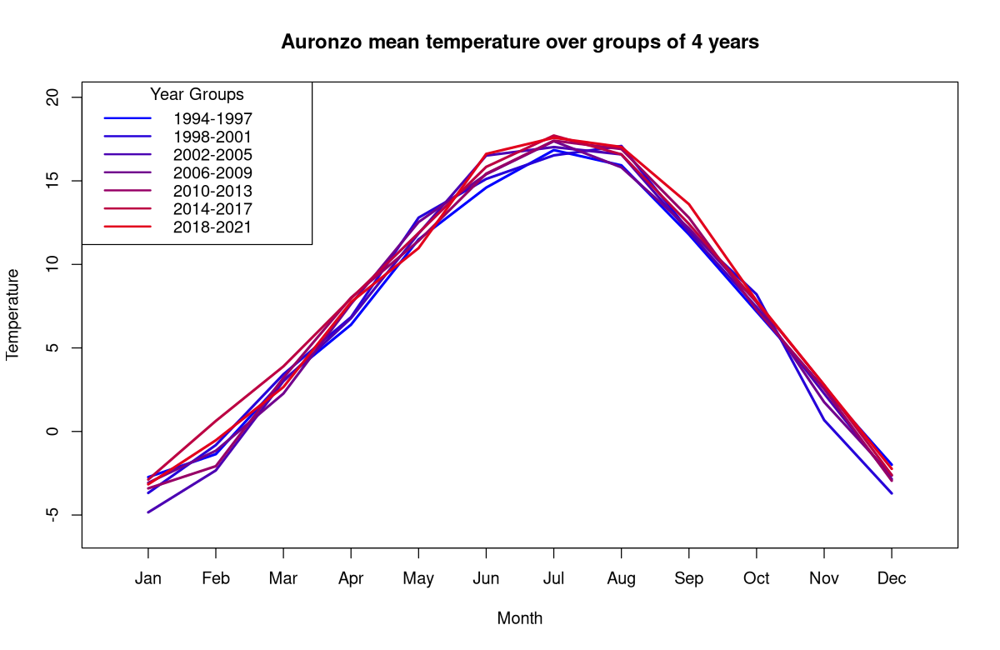

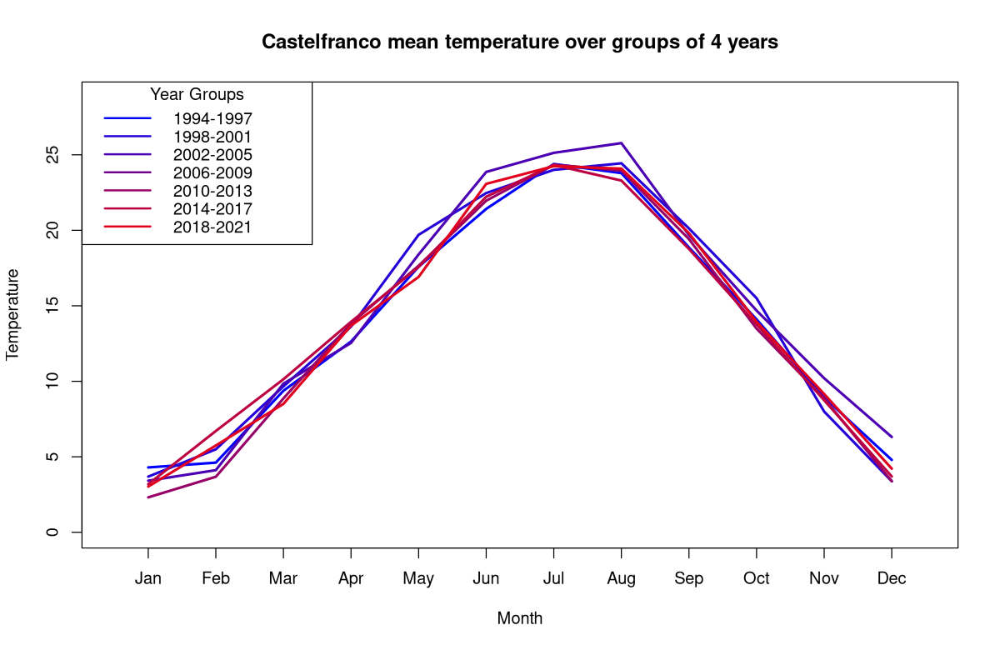

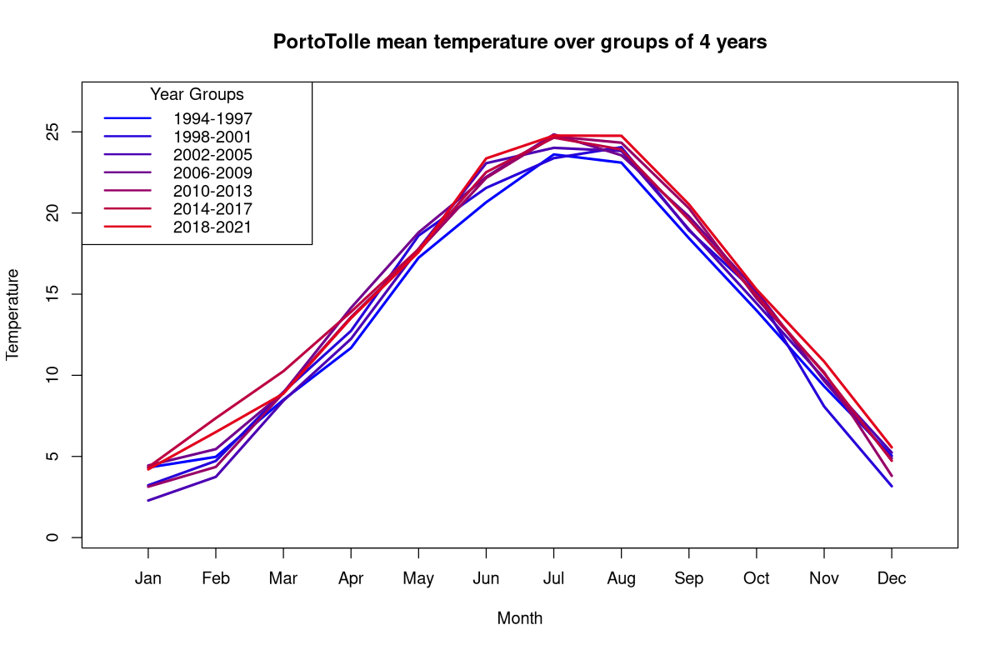

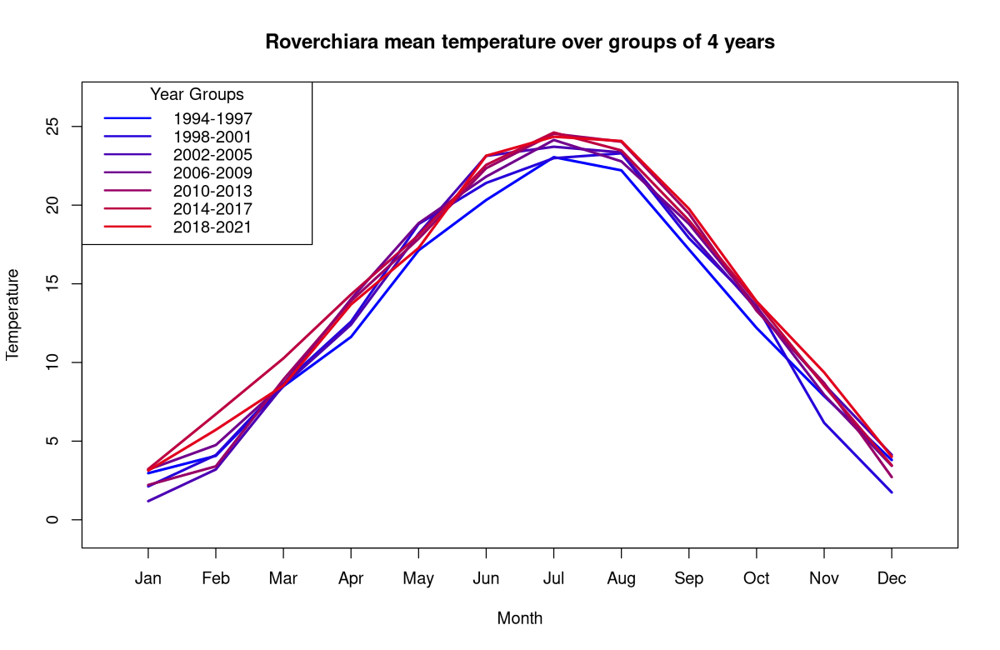

In [51]:
# we want only mean temperature
tipo <- 'mean'
group.size <- 4

# all groups and colors
n.groups <- max(years) - min(years) - group.size + 2
colors <- colorRampPalette(c("blue", "red"))(n.groups)
year.starts <- min(years):(max(years) - group.size + 1)

plot.groups.idx <- seq(1, length(year.starts), by = group.size)
legend.labels <- paste(year.starts[plot.groups.idx], year.starts[plot.groups.idx] + group.size - 1, sep = "-")
legend.colors <- colors[plot.groups.idx]

# color index
for(paese in paesi){
    # retrieve the data
    data <- df_anni[df_anni$paese == paese & df_anni$tipo == tipo,]
    max.y <- max(data[, 4:(ncol(data) - 2)])
    min.y <- min(data[, 4:(ncol(data) - 2)])

    # size of plot
    options(repr.plot.width = 10, repr.plot.height = 6.5)
    
    plot(numeric(0), numeric(0), xlim = c(0.5, 12.5), ylim = c(min.y,max.y),
         xlab = "Month", ylab = "Temperature",
         main = paste(paese, tipo, "temperature over groups of 4 years"),
         xaxt = "n",
         fig.dim = c(20,12))
    
    axis(1, at = 1:12, labels = month.abb)  # month labels

    for (i in plot.groups.idx) {
            year <- year.starts[i]
            group.years <- year:(year + group.size - 1)
            sel.data <- data[data$Anno %in% group.years, ]
            monthly.T <- sel.data[, 4:(ncol(sel.data) - 2)]
            averaged <- colMeans(monthly.T, na.rm = TRUE)
        
            lines(1:length(averaged), averaged, col = colors[i], lwd = 2.5)
           
    }
    
    legend("topleft", inset = c(0, 0),
           legend = legend.labels,
           col = legend.colors, lty = 1, lwd = 2,
           title = "Year Groups", cex = 1)
   
}


# 3) Future temperatures prediction with ARIMA algorithm

The *ARIMA model (Auto-Regressive Integrated Moving Average)* is a statistical technique for time series analysis and forecasting, implemented in R through the *forecast* package.

- **AR (Auto-Regressive):** represents the dependence of the predicted value predicted from the past values of the series;
- **I (Integrated):** describes the differentiation of the data to make the series stationary, so free from trends;
- **MA (Moving Average):** describes the dependance of the predicted value from the past forecast errors.

The ARMA model (combination of the AR and MA components) can be used only on stationary series. When the series shows a trend over time as in our case, where a linear growth is assumed, it is necessary to difference the series (I) to achieve stationarity of the mean. The resulting model is **ARIMA$(p, d, q)$**, where **p** indicates the number of autoregressive terms (how many past values are used to predict the current value), **d** represents how many times the data must be differentiated in order to obtain a stationary series and **q** defines how many past errors are used to estimate the current value. 

Explicitely, first of all the algorithm subtracts from each point $Y_i$ of the series the previous $d$ terms, to perform detrending. Then, the predicted value at general time t is modeled as:

$$Y_t = \phi_1 Y_{t-1} + \phi_2 Y_{t-2} + \cdots + \phi_p Y_{t-p} + \epsilon_t + \theta_1 \epsilon_{t-1} + \theta_2 \epsilon_{t-2} + \cdots + \theta_q \epsilon_{t-q}$$ 

using both a weighted sum of the $p$ previous values $Y_{t-1},...,Y_{t-p}$ (**AR** component) and a weighted sum of the $q$ previous errors $\epsilon_{t-1},...,\epsilon_{t-q}$ (**MA**  component). A new error $\epsilon_t$ is added in every step (white noise). ARIMA algorithms learns the coefficients of the model using maximum likelihood estimation (MLE). In particular the algorithm initializes coefficients, evaluates how likely the observed data is under the current model and iteratively updates the coefficients to maximize the likelihood.

In our analysis, we look for the best model defined by the combination of the three parameters, with maximum values of p=15, d=2, and q=5.

When the series exhibits a seasonal component, as it happens for monthly temperature averages for each year, it is possible to use the version of the algorithm  that takes into account seasonal effects: *SARIMA*. SARIMA extends ARIMA by applying AR and MA logic over seasonal lags of a fixed lenght $s$.

First, we try to predict the monthly mean temperature over a 20 years period (2024-2044). Seasonal effects are obviously present and therefore we use a SARIMA model with a lag $s=12$ months.

In [ ]:
#install.packages("forecast")
library(forecast)


 Fitting models using approximations to speed things up...

 ARIMA(2,0,2)(1,1,1)[12] with drift         : 1275.267
 ARIMA(0,0,0)(0,1,0)[12] with drift         : 1481.8
 ARIMA(1,0,0)(1,1,0)[12] with drift         : 1349.285
 ARIMA(0,0,1)(0,1,1)[12] with drift         : 1288.335
 ARIMA(0,0,0)(0,1,0)[12]                    : 1479.934
 ARIMA(2,0,2)(0,1,1)[12] with drift         : 1273.555
 ARIMA(2,0,2)(0,1,0)[12] with drift         : 1448.185
 ARIMA(2,0,2)(0,1,2)[12] with drift         : 1275.645
 ARIMA(2,0,2)(1,1,0)[12] with drift         : 1352.515
 ARIMA(2,0,2)(1,1,2)[12] with drift         : Inf
 ARIMA(1,0,2)(0,1,1)[12] with drift         : 1287.222
 ARIMA(2,0,1)(0,1,1)[12] with drift         : 1274.739
 ARIMA(3,0,2)(0,1,1)[12] with drift         : 1278.413
 ARIMA(2,0,3)(0,1,1)[12] with drift         : 1275.471
 ARIMA(1,0,1)(0,1,1)[12] with drift         : 1285.724
 ARIMA(1,0,3)(0,1,1)[12] with drift         : 1275.978
 ARIMA(3,0,1)(0,1,1)[12] with drift         : 1276.578
 ARIMA(3,0,

Series: ts_monthly 
ARIMA(3,0,3)(1,1,0)[12] with drift 

Coefficients:
          ar1     ar2      ar3     ma1     ma2     ma3     sar1   drift
      -0.5119  0.1418  -0.0749  0.7846  0.0696  0.2065  -0.5152  0.0045
s.e.   0.6793  0.3559   0.3381  0.6740  0.5146  0.2733   0.0460  0.0066

sigma^2 = 2.522:  log likelihood = -675.55
AIC=1369.09   AICc=1369.61   BIC=1404.07

Training set error measures:
                      ME     RMSE      MAE       MPE     MAPE      MASE
Training set -0.01055858 1.544798 1.213534 -2.458286 29.00977 0.7855055
                     ACF1
Training set -0.001061785

Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


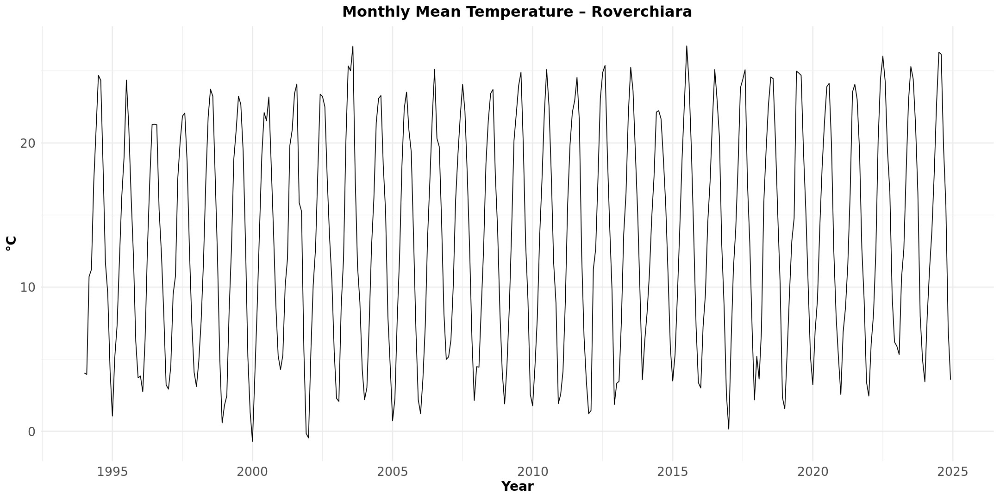

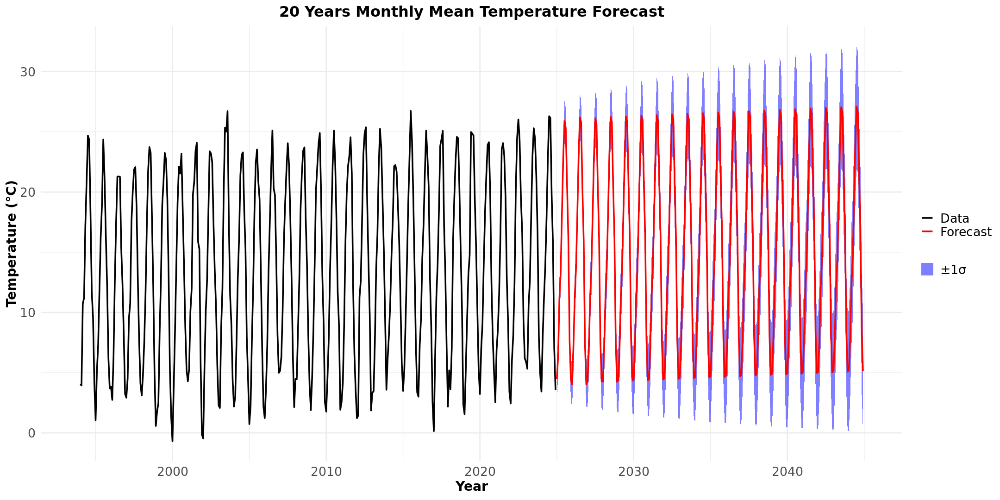

In [11]:
# monthly predictions 

df_monthly <- df_94 |>
  mutate(year  = year(date),month = month(date)) |>
  group_by(paese, year, month) |> summarise(Tmean = mean(TMED, na.rm = TRUE),.groups = "drop")


df_m <- df_monthly |> filter(paese == "Roverchiara") |> arrange(year, month) # cosnider Roverchiara as example

# build a monthly timeseries 
start_year  <- df_m$year[1]
start_month <- df_m$month[1]
ts_monthly <- ts(df_m$Tmean,
                 start     = c(start_year, start_month),
                 frequency = 12)


# SARIMA fit (ARIMA with seasonality)
fit_monthly <- auto.arima(ts_monthly, seasonal = TRUE,allowdrift = TRUE,trace = TRUE) # looks for the best combination of SARIMA model 

summary(fit_monthly)

# forecast next 20 years
fcast <- forecast(fit_monthly, h = 12*20,level = 68.27) # forecasts with +- 1sigma shaded region

df_fc <- data.frame(
  time = time(fcast$mean),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1] - fcast$lower[,1]) / 2)

options(repr.plot.width = 18, repr.plot.height=9)

theme_custom <- theme_minimal(base_size = 16) + theme(
    plot.title = element_text(face = "bold", hjust = 0.5),
    axis.text = element_text(size = 16),
    axis.title = element_text(size = 17,face="bold"),
    legend.title = element_blank(),
    legend.text = element_text(size = 16))

autoplot(ts_monthly) +
  ggtitle("Monthly Mean Temperature – Roverchiara") +
  xlab("Year") + ylab("°C")+theme_custom

ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(
      x  = time,
      ymin = mean - 1*se,
      ymax = mean + 1*se,
      fill = "±1σ" ),
    alpha = 0.5) +
  geom_line(
    data = df_fc,
    aes(x = time, y = mean, colour = "Forecast"),
    size = 1) +
  geom_line(
    aes(x = time(ts_monthly), y = as.numeric(ts_monthly), colour = "Data"),
    size = 1) +
  scale_colour_manual(
    name   = NULL,
    values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(
    name   = NULL,
    values = c("±1σ" = "blue")) +
  labs(
    title = "20 Years Monthly Mean Temperature Forecast",
    x = "Year",
    y = "Temperature (°C)") + theme_custom



We observe a clear upward trend in the predictions, however big error bars are present. The model appears quite simple: it replicates the sinusoidal component of the data and adds a linear growing trend.


We then attempted to infer annual average temperatures to see if more precise predictions can be obtained.  In this case we usa a standard ARIMA model since we are dealing with only one data point per year with no clear seasonal effects.


`summarise()` has grouped output by 'paese'. You can override using the `.groups` argument.



 ARIMA(0,1,0)                    : 52.11339
 ARIMA(0,1,0) with drift         : 54.26814
 ARIMA(0,1,1)                    : 49.50498
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 50.71754
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(0,1,3)                    : 53.01259
 ARIMA(0,1,3) with drift         : Inf
 ARIMA(0,1,4)                    : 55.32558
 ARIMA(0,1,4) with drift         : Inf
 ARIMA(0,1,5)                    : Inf
 ARIMA(0,1,5) with drift         : Inf
 ARIMA(1,1,0)                    : 52.72925
 ARIMA(1,1,0) with drift         : 54.8
 ARIMA(1,1,1)                    : 51.25251
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : 53.20377
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(1,1,3)                    : Inf
 ARIMA(1,1,3) with drift         : Inf
 ARIMA(1,1,4)                    : Inf
 ARIMA(1,1,4) with drift         : Inf
 ARIMA(2,1,0)                    : 51.6527
 ARIMA(2,1,0) with drift         : 52.97821
 ARIMA(2

Series: ts_yearly 
ARIMA(0,1,1) 

Coefficients:
          ma1
      -0.5949
s.e.   0.1661

sigma^2 = 0.2681:  log likelihood = -22.53
AIC=49.06   AICc=49.5   BIC=51.86

Training set error measures:
                   ME     RMSE       MAE       MPE     MAPE      MASE      ACF1
Training set 0.106749 0.500778 0.4086654 0.6645434 3.034919 0.9302245 0.1407182

Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting to continuous.


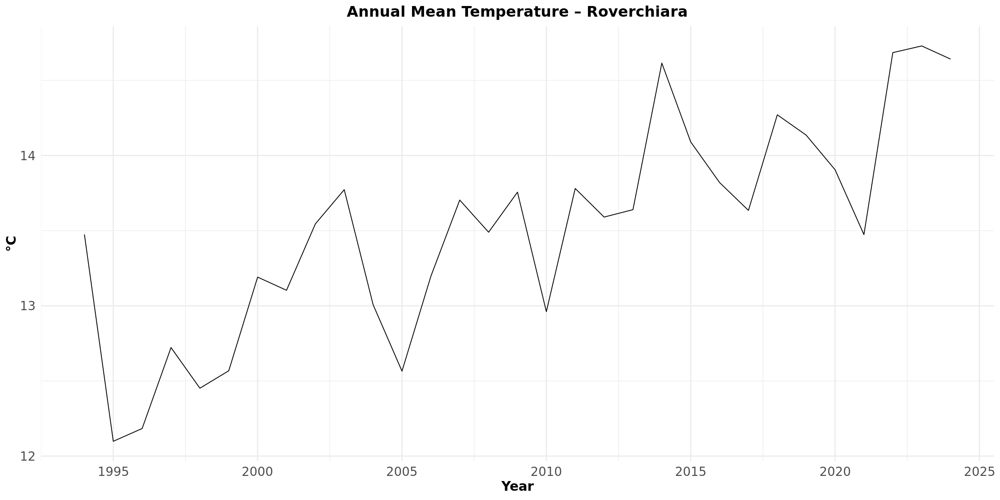

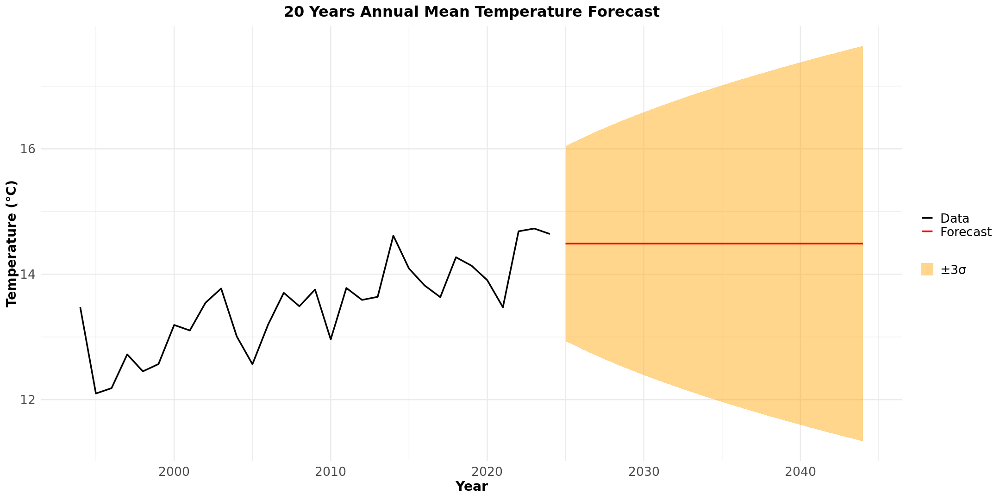

In [12]:
# annual predictions

df_yearly <- df_94 |>
  mutate(year  = year(date),month = month(date)) |>
  group_by(paese, year) |> summarise(Tmean = mean(TMED, na.rm = TRUE),groups = "drop")


df_y <- df_yearly |> filter(paese == "Roverchiara") |> arrange(year) # cosnider Roverchiara as example

# build yearly timeseries 
start_year  <- df_m$year[1]
ts_yearly <- ts(df_y$Tmean,
                 start = c(start_year),
                 frequency = 1)

autoplot(ts_yearly) +
  ggtitle("Annual Mean Temperature – Roverchiara") +
  xlab("Year") + ylab("°C")+theme_custom

# ARIMA fit 
fit_yearly <- auto.arima(ts_yearly,max.p=15,max.d=2,max.q=5,allowdrift = TRUE,trace = TRUE,stepwise = FALSE) # looks for the best combination of SARIMA model 
summary(fit_yearly)

# forecast next 20 years
fcast <- forecast(fit_yearly, h = 20,level = 68.27) # forecasts with +- 1sigma errors

df_fc <- data.frame(
  time = time(fcast$mean),
  mean = as.numeric(fcast$mean),
  se  = (fcast$upper[,1] - fcast$lower[,1]) / 2)

ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(
      x  = time,
      ymin = mean - 3*se,
      ymax = mean + 3*se,
      fill = "±3σ" ),
    alpha = 0.45) +
  geom_line(
    data = df_fc,
    aes(x = time, y = mean, colour = "Forecast"),
    size = 1 ) +
  geom_line(
    aes(x = time(ts_yearly), y = as.numeric(ts_yearly), colour = "Data"),
    size = 1) +
  scale_colour_manual(
    name   = NULL,
    values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(
    name   = NULL,
    values = c("±3σ" = "orange") ) +
  labs(
    title  = "20 Years Annual Mean Temperature Forecast",
    x  = "Year",
    y  = "Temperature (°C)") +
  theme_custom

The algorithm identifies a constant model as the best fit ($p=0$), indicating that past observations are not utilized for forecasting. This suggests that the annual average temperature data may be too noisy for a reliable prediction. 

To address this, we now try to reduce volatility and improve forecast accuracy by averaging the data over three years and repeating the process for every weather station considered.


 ARIMA(0,1,0)                    : 8.544315
 ARIMA(0,1,0) with drift         : 6.739831
 ARIMA(0,1,1)                    : 11.71448
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 13.61464
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(1,1,0)                    : 11.66686
 ARIMA(1,1,0) with drift         : 1.556338
 ARIMA(1,1,1)                    : Inf
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : Inf
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(2,1,0)                    : 8.7892
 ARIMA(2,1,0) with drift         : 7.482644
 ARIMA(2,1,1)                    : Inf
 ARIMA(2,1,1) with drift         : Inf
 ARIMA(2,1,2)                    : Inf
 ARIMA(2,1,2) with drift         : Inf
 ARIMA(3,1,0)                    : 14.71627
 ARIMA(3,1,0) with drift         : 10.08713
 ARIMA(3,1,1)                    : Inf
 ARIMA(3,1,1) with drift         : Inf
 ARIMA(3,1,2)                    : Inf
 ARIMA(3,1,2) with drift         : Inf



 Best model:

Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.


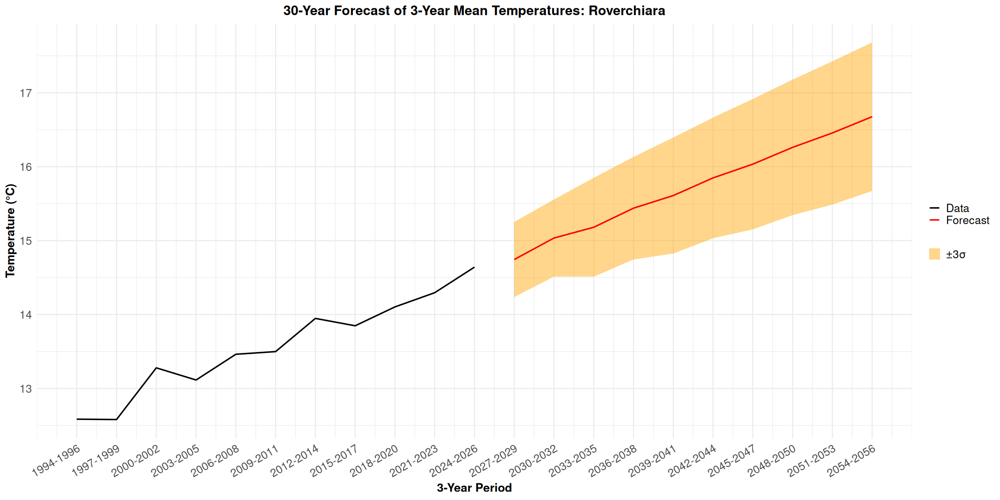

In [56]:
# 3 year-average predictions

min_year <- min(year(df_94$date), na.rm = TRUE)

df_3yr <- df_94 |> mutate(
    year = year(date),
    year_group = floor((year-min_year)/3)) |>
    group_by(paese, year_group) |>
    summarise(
    Tmean   = mean(TMED, na.rm = TRUE),
    .groups = "drop") |>
    mutate(
    start_year = min_year+ 3*year_group,
    end_year = start_year+2,
    period   = paste0(start_year, "-", end_year))

df_3yr <- df_3yr |>
  filter(paese == "Roverchiara") |>
  arrange(start_year)

# define timeseries of temperatures
ts_3yr <- ts(df_3yr$Tmean, start = 1, frequency = 1)


fit_3yr <- auto.arima(ts_3yr, max.p = 15, max.d = 2, max.q = 2,
                      allowdrift = TRUE, trace = TRUE, stepwise = FALSE) # find best model

# forecast next 10 groups (30 years)
fcast <- forecast(fit_3yr, h=10, level= 68.27)

df_fc <- data.frame(
  time = as.numeric(time(fcast$mean)),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1]-fcast$lower[,1])/2)

df_fc$period <- paste0(
df_3yr$end_year[nrow(df_3yr)] + 1+3*(0:9), "-",
df_3yr$end_year[nrow(df_3yr)] + 3*(1:10))

df_3yr$time <- 1:nrow(df_3yr)

# period labels
x_ticks <- c(df_3yr$time, df_fc$time)
x_labels <- c(df_3yr$period, df_fc$period)

options(repr.plot.width = 20, repr.plot.height=10)
ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(x = time, ymin = mean -3*se, ymax = mean +3*se, fill = "±3σ"),
    alpha = 0.45) +
  geom_line(data = df_fc, aes(x = time, y = mean, colour = "Forecast"), size = 1) +
  geom_line(data = df_3yr, aes(x = time, y = Tmean, colour = "Data"), size = 1) +
  scale_x_continuous(
    breaks = x_ticks,
    labels = x_labels) +
  scale_colour_manual(name = NULL, values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(name = NULL, values = c("±3σ" = "orange")) +
  labs(
    title = "30-Year Forecast of 3-Year Mean Temperatures: Roverchiara",
    x = "3-Year Period",
    y = "Temperature (°C)") +
  theme_custom +
  theme(axis.text.x = element_text(angle=30, hjust = 1))

In [57]:
lm_fcast <- lm(mean ~ time, data = df_fc)
slope <- coef(lm_fcast)[["time"]]/3
model_summary <- summary(lm_fcast)
slope_se  <- model_summary$coefficients["time", "Std. Error"]/3
print(paste("Slope of forecast in Roverchiara: +", round(slope*10,2),"+-",round(slope_se*10,2), "°C/10-year"))

[1] "Slope of forecast in Roverchiara: + 0.7 +- 0.01 °C/10-year"



 ARIMA(0,1,0)                    : 9.868828
 ARIMA(0,1,0) with drift         : 9.433083
 ARIMA(0,1,1)                    : 12.6656
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 12.49312
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(1,1,0)                    : 12.12255
 ARIMA(1,1,0) with drift         : 3.242329
 ARIMA(1,1,1)                    : Inf
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : 18.43397
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(2,1,0)                    : 11.55532
 ARIMA(2,1,0) with drift         : 8.878256
 ARIMA(2,1,1)                    : Inf
 ARIMA(2,1,1) with drift         : Inf
 ARIMA(2,1,2)                    : Inf
 ARIMA(2,1,2) with drift         : Inf
 ARIMA(3,1,0)                    : Inf
 ARIMA(3,1,0) with drift         : 15.74693
 ARIMA(3,1,1)                    : Inf
 ARIMA(3,1,1) with drift         : Inf
 ARIMA(3,1,2)                    : Inf
 ARIMA(3,1,2) with drift         : Inf



 Best model

Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.


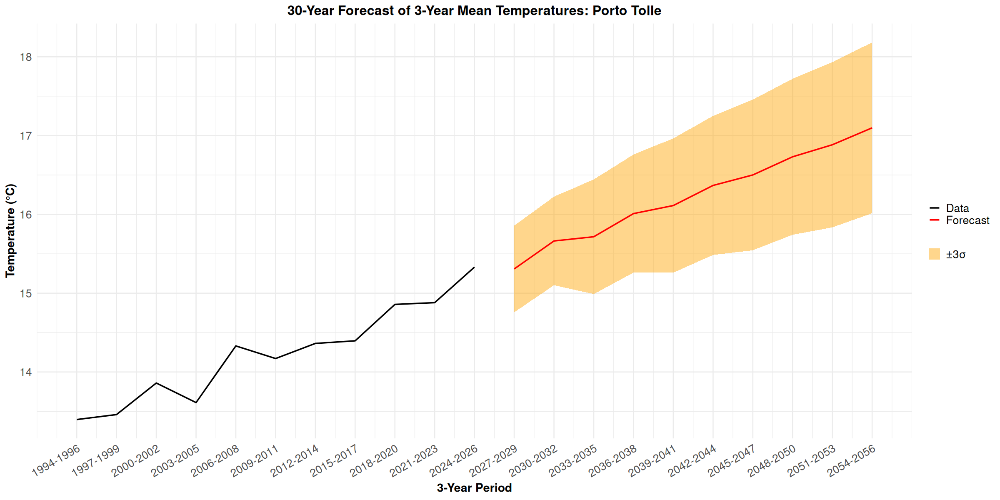

In [58]:
# 3 year-average predictions PortoTolle

min_year <- min(year(df_94$date), na.rm = TRUE)

df_3yr <- df_94 |> mutate(
    year = year(date),
    year_group = floor((year-min_year)/3)) |>
    group_by(paese, year_group) |>
    summarise(
    Tmean   = mean(TMED, na.rm = TRUE),
    .groups = "drop") |>
    mutate(
    start_year = min_year+ 3*year_group,
    end_year = start_year+2,
    period   = paste0(start_year, "-", end_year))

df_3yr <- df_3yr |>
  filter(paese == "PortoTolle") |>
  arrange(start_year)

# define timeseries of temperatures
ts_3yr <- ts(df_3yr$Tmean, start = 1, frequency = 1)


fit_3yr <- auto.arima(ts_3yr, max.p = 15, max.d = 2, max.q = 2,
                      allowdrift = TRUE, trace = TRUE, stepwise = FALSE) # find best model

# forecast next 10 groups (30 years)
fcast <- forecast(fit_3yr, h=10, level= 68.27)

df_fc <- data.frame(
  time = as.numeric(time(fcast$mean)),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1]-fcast$lower[,1])/2)

df_fc$period <- paste0(
df_3yr$end_year[nrow(df_3yr)] + 1+3*(0:9), "-",
df_3yr$end_year[nrow(df_3yr)] + 3*(1:10))

df_3yr$time <- 1:nrow(df_3yr)

# period labels
x_ticks <- c(df_3yr$time, df_fc$time)
x_labels <- c(df_3yr$period, df_fc$period)

options(repr.plot.width = 20, repr.plot.height=10)
ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(x = time, ymin = mean -3*se, ymax = mean +3*se, fill = "±3σ"),
    alpha = 0.45) +
  geom_line(data = df_fc, aes(x = time, y = mean, colour = "Forecast"), size = 1) +
  geom_line(data = df_3yr, aes(x = time, y = Tmean, colour = "Data"), size = 1) +
  scale_x_continuous(
    breaks = x_ticks,
    labels = x_labels) +
  scale_colour_manual(name = NULL, values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(name = NULL, values = c("±3σ" = "orange")) +
  labs(
    title = "30-Year Forecast of 3-Year Mean Temperatures: Porto Tolle",
    x = "3-Year Period",
    y = "Temperature (°C)") +
  theme_custom +
  theme(axis.text.x = element_text(angle=30, hjust = 1))

In [59]:
lm_fcast <- lm(mean ~ time, data = df_fc)
slope <- coef(lm_fcast)[["time"]]/3
model_summary <- summary(lm_fcast)
slope_se  <- model_summary$coefficients["time", "Std. Error"]/3
print(paste("Slope of forecast in Porto Tolle: +", round(slope*10,2),"+-",round(slope_se*10,2), "°C/10-year"))

[1] "Slope of forecast in Porto Tolle: + 0.64 +- 0.02 °C/10-year"



 ARIMA(0,1,0)                    : 11.33851
 ARIMA(0,1,0) with drift         : 13.08785
 ARIMA(0,1,1)                    : 12.8136
 ARIMA(0,1,1) with drift         : Inf
 ARIMA(0,1,2)                    : 14.93089
 ARIMA(0,1,2) with drift         : Inf
 ARIMA(1,1,0)                    : 11.02576
 ARIMA(1,1,0) with drift         : 10.25316
 ARIMA(1,1,1)                    : Inf
 ARIMA(1,1,1) with drift         : Inf
 ARIMA(1,1,2)                    : Inf
 ARIMA(1,1,2) with drift         : Inf
 ARIMA(2,1,0)                    : 13.9349
 ARIMA(2,1,0) with drift         : 16.21138
 ARIMA(2,1,1)                    : Inf
 ARIMA(2,1,1) with drift         : Inf
 ARIMA(2,1,2)                    : Inf
 ARIMA(2,1,2) with drift         : Inf
 ARIMA(3,1,0)                    : 19.86233
 ARIMA(3,1,0) with drift         : 20.72626
 ARIMA(3,1,1)                    : Inf
 ARIMA(3,1,1) with drift         : Inf
 ARIMA(3,1,2)                    : Inf
 ARIMA(3,1,2) with drift         : Inf



 Best model:

Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.
Don't know how to automatically pick scale for object of type <ts>. Defaulting
to continuous.


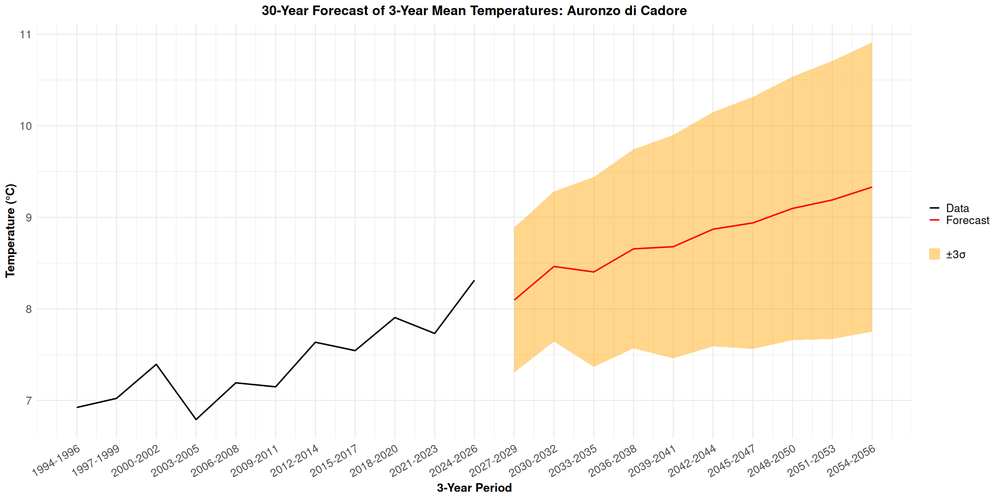

In [60]:
# 3 year-average predictions Auronzo di Cadore

min_year <- min(year(df_94$date), na.rm = TRUE)

df_3yr <- df_94 |> mutate(
    year = year(date),
    year_group = floor((year-min_year)/3)) |>
    group_by(paese, year_group) |>
    summarise(
    Tmean   = mean(TMED, na.rm = TRUE),
    .groups = "drop") |>
    mutate(
    start_year = min_year+ 3*year_group,
    end_year = start_year+2,
    period   = paste0(start_year, "-", end_year))

df_3yr <- df_3yr |>
  filter(paese == "Auronzo") |>
  arrange(start_year)

# define timeseries of temperatures
ts_3yr <- ts(df_3yr$Tmean, start = 1, frequency = 1)


fit_3yr <- auto.arima(ts_3yr, max.p = 15, max.d = 2, max.q = 2,
                      allowdrift = TRUE, trace = TRUE, stepwise = FALSE) # find best model

# forecast next 10 groups (30 years)
fcast <- forecast(fit_3yr, h=10, level= 68.27)

df_fc <- data.frame(
  time = as.numeric(time(fcast$mean)),
  mean = as.numeric(fcast$mean),
  se   = (fcast$upper[,1]-fcast$lower[,1])/2)

df_fc$period <- paste0(
df_3yr$end_year[nrow(df_3yr)] + 1+3*(0:9), "-",
df_3yr$end_year[nrow(df_3yr)] + 3*(1:10))

df_3yr$time <- 1:nrow(df_3yr)

# period labels
x_ticks <- c(df_3yr$time, df_fc$time)
x_labels <- c(df_3yr$period, df_fc$period)

options(repr.plot.width = 20, repr.plot.height=10)
ggplot() +
  geom_ribbon(
    data = df_fc,
    aes(x = time, ymin = mean -3*se, ymax = mean +3*se, fill = "±3σ"),
    alpha = 0.45) +
  geom_line(data = df_fc, aes(x = time, y = mean, colour = "Forecast"), size = 1) +
  geom_line(data = df_3yr, aes(x = time, y = Tmean, colour = "Data"), size = 1) +
  scale_x_continuous(
    breaks = x_ticks,
    labels = x_labels) +
  scale_colour_manual(name = NULL, values = c("Data" = "black", "Forecast" = "red")) +
  scale_fill_manual(name = NULL, values = c("±3σ" = "orange")) +
  labs(
    title = "30-Year Forecast of 3-Year Mean Temperatures: Auronzo di Cadore",
    x = "3-Year Period",
    y = "Temperature (°C)") +
  theme_custom +
  theme(axis.text.x = element_text(angle=30, hjust = 1))

In [61]:
lm_fcast <- lm(mean ~ time, data = df_fc)
slope <- coef(lm_fcast)[["time"]]/3
model_summary <- summary(lm_fcast)
slope_se  <- model_summary$coefficients["time", "Std. Error"]/3
print(paste("Slope of forecast in Auronzo: +", round(slope*10,2),"+-",round(slope_se*10,2), "°C/10-year"))


[1] "Slope of forecast in Auronzo: + 0.42 +- 0.03 °C/10-year"


In each of the three distinct cases the algorithm is forecasting a slightly higher increase in mean temperatures  and smaller errors compared to what we found with the Bayesian linear model analysis: 

- Roverchiara: $\frac{\Delta T_{JAGS}}{10 Y}= + 0.63 \pm 0.07\,^\circ\mathrm{C}$ vs $\frac{\Delta T_{ARIMA}}{10 Y}= + 0.70 \pm 0.01\,^\circ\mathrm{C}$

- Porto Tolle: $\frac{\Delta T_{JAGS}}{10 Y}= + 0.57 \pm 0.07\,^\circ\mathrm{C}$ vs $\frac{\Delta T_{ARIMA}}{10 Y}= + 0.64 \pm 0.02\,^\circ\mathrm{C}$

- Auronzo di Cadore: $\frac{\Delta T_{JAGS}}{10 Y}= + 0.35 \pm 0.06\,^\circ\mathrm{C}$ vs $\frac{\Delta T_{ARIMA}}{10 Y}= + 0.42 \pm 0.03\,^\circ\mathrm{C}$

We compare these results with the study available in the 2021 SNPA Annual report (https://www.snpambiente.it/wp-content/uploads/2021/06/Rapporto-SNPA-21_2021.pdf), which provides a forecast for the mean temperatures in Italy under two different socio-economic and emission scenarios:
- RCP4.5 model: considers a scenario with a decrease in greenhouse emissions starting from 2040, and predicts an average increase in mean temperatures of $\frac{\Delta T}{10 Y}=0.2 °C$ over the century.
  
- RCP8.5 model: considers a scenario with a continous increase in greenhouse emissions during the century, without significant mitigation, and thus predicts an average increase in mean temperatures of $\frac{\Delta T}{10 Y}=0.4 °C$ over the century.
  
  
The predictions from the ARIMA algorithm, limited to data from only 3 stations in a specific Italian region, are more consistent with the most pessimistic scenario. 

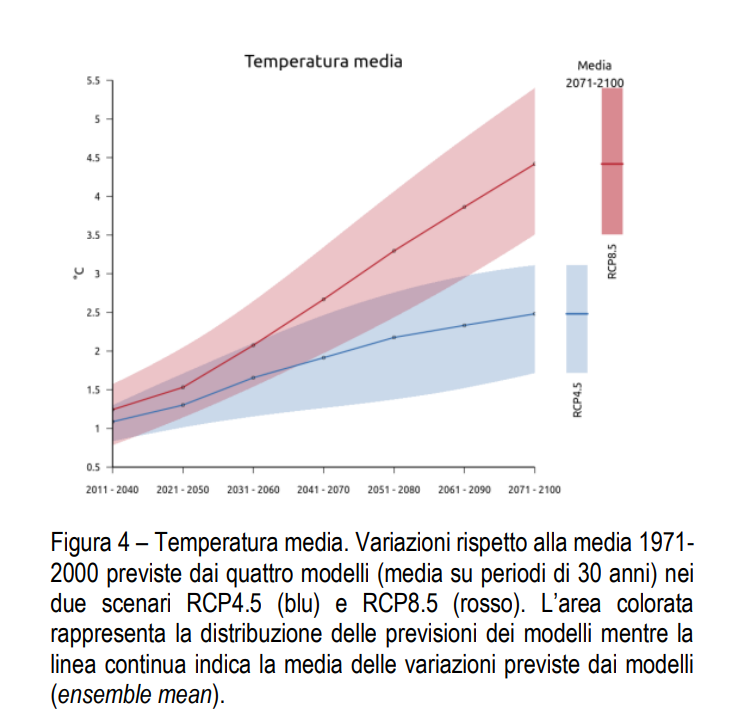

In [26]:
library(IRdisplay)
img_raw <- readBin("SNPA_predictions.png", what = "raw", n = file.info("SNPA_predictions.png")$size)
display_png(img_raw, width = 700)